In [118]:
import numpy as np
import re
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams["figure.figsize"] = [8, 7]
import seaborn as sns
import pandas as pd 
import datetime as dt
import time as tm
from datetime import date
import calendar
import sklearn
import graphviz
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 5000)
import os
os.chdir =("C:/Users/akshay.v/Applied Data Science with Python/C3 Applied Machine Learning in Python/Data/")
os.getcwd()

'C:\\Users\\Akshay.V\\Applied Data Science with Python\\C3 Applied Machine Learning in Python'

In [2]:
def readdf(path):
    any_df = pd.read_csv(path)
    return any_df

def writedf2xlsx(any_df, name):
    from pandas import ExcelWriter
    writer = ExcelWriter(name + '.xlsx')
    any_df.to_excel(writer,'Sheet1')
    writer.save()
    
def savefig(image_name):
    fig.savefig(str(image_name) + '.png')

In [3]:
fruits = pd.read_table('Data/fruit_data_with_colors.txt')
fruits.head()

,fruit_label,fruit_name,fruit_subtype,mass,width,height,color_score
0,1,apple,granny_smith,192,8.4,7.3,0.55
1,1,apple,granny_smith,180,8.0,6.8,0.59
2,1,apple,granny_smith,176,7.4,7.2,0.60
3,2,mandarin,mandarin,86,6.2,4.7,0.80
4,2,mandarin,mandarin,84,6.0,4.6,0.79


In [4]:
fruits.shape

(59, 7)

In [5]:
fruits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59 entries, 0 to 58
Data columns (total 7 columns):
fruit_label      59 non-null int64
fruit_name       59 non-null object
fruit_subtype    59 non-null object
mass             59 non-null int64
width            59 non-null float64
height           59 non-null float64
color_score      59 non-null float64
dtypes: float64(3), int64(2), object(2)
memory usage: 3.3+ KB


In [6]:
fruits.dtypes

fruit_label        int64
fruit_name        object
fruit_subtype     object
mass               int64
width            float64
height           float64
color_score      float64
dtype: object

In [7]:
fruits.describe()

,fruit_label,mass,width,height,color_score
count,59.000000,59.000000,59.000000,59.000000,59.000000
mean,2.542373,163.118644,7.105085,7.693220,0.762881
std,1.208048,55.018832,0.816938,1.361017,0.076857
min,1.000000,76.000000,5.800000,4.000000,0.550000
25%,1.000000,140.000000,6.600000,7.200000,0.720000
50%,3.000000,158.000000,7.200000,7.600000,0.750000
75%,4.000000,177.000000,7.500000,8.200000,0.810000
max,4.000000,362.000000,9.600000,10.500000,0.930000


In [8]:
look_up_fruitnames = dict(zip(fruits.fruit_label.unique(), fruits.fruit_name.unique()))
look_up_fruitnames

{1: 'apple', 2: 'mandarin', 3: 'orange', 4: 'lemon'}

## Create a Trian-Test Split

#### The random_state parameter provides a seed value to the function's internal random number generator. To get a different sample every time, change the values of the random_state parameter. This is a 75-25% partition between train and test data set.  

In [9]:
# X is a Dataframe while y is Vector which is why it's initialised in lowercase letter
from sklearn.model_selection import train_test_split

#X = fruits[['mass', 'width','height']]
X = fruits
y = fruits['fruit_label']

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 0)

In [10]:
X_train

,fruit_label,fruit_name,fruit_subtype,mass,width,height,color_score
42,3,orange,turkey_navel,154,7.2,7.2,0.82
48,4,lemon,spanish_belsan,174,7.3,10.1,0.72
7,2,mandarin,mandarin,76,5.8,4.0,0.81
14,1,apple,golden_delicious,152,7.6,7.3,0.69
32,3,orange,selected_seconds,164,7.2,7.0,0.80
49,4,lemon,unknown,132,5.8,8.7,0.73
29,3,orange,selected_seconds,160,7.0,7.4,0.81
37,3,orange,turkey_navel,154,7.3,7.3,0.79
56,4,lemon,unknown,116,5.9,8.1,0.73
18,1,apple,cripps_pink,162,7.5,7.1,0.83


In [11]:
X_test

,fruit_label,fruit_name,fruit_subtype,mass,width,height,color_score
26,3,orange,spanish_jumbo,362,9.6,9.2,0.74
35,3,orange,turkey_navel,150,7.1,7.9,0.75
43,4,lemon,spanish_belsan,194,7.2,10.3,0.70
28,3,orange,selected_seconds,140,6.7,7.1,0.72
11,1,apple,braeburn,172,7.1,7.6,0.92
2,1,apple,granny_smith,176,7.4,7.2,0.60
34,3,orange,turkey_navel,142,7.6,7.8,0.75
46,4,lemon,spanish_belsan,216,7.3,10.2,0.71
40,3,orange,turkey_navel,154,7.1,7.5,0.78
22,1,apple,cripps_pink,140,7.3,7.1,0.87


In [12]:
y_train

42    3
48    4
7     2
14    1
32    3
49    4
29    3
37    3
56    4
18    1
55    4
27    3
15    1
5     2
31    3
16    1
50    4
20    1
51    4
8     1
13    1
25    3
17    1
58    4
57    4
52    4
38    3
1     1
12    1
45    4
24    3
6     2
23    1
36    3
21    1
19    1
9     1
39    3
54    4
3     2
0     1
53    4
47    4
44    4
Name: fruit_label, dtype: int64

In [13]:
y_test

26    3
35    3
43    4
28    3
11    1
2     1
34    3
46    4
40    3
22    1
4     2
10    1
30    3
41    3
33    3
Name: fruit_label, dtype: int64

C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead
  


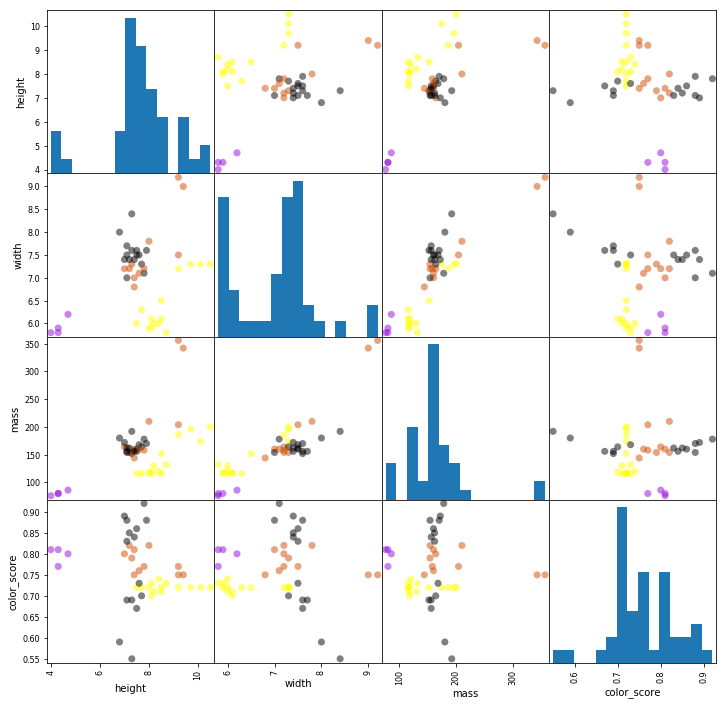

In [14]:
from matplotlib import cm

X = fruits[['height', 'width', 'mass', 'color_score']]
y = fruits['fruit_label']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

cmap = cm.get_cmap('gnuplot')
scatter = pd.scatter_matrix(X_train, c=y_train, marker='o', s=50, hist_kwds={'bins':15}, figsize=(12,12), cmap=cmap)

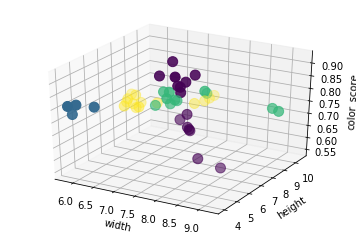

In [15]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_train['width'], X_train['height'], X_train['color_score'], c=y_train, marker='o', s=100)
ax.set_xlabel('width')
ax.set_ylabel('height')
ax.set_zlabel('color_score')
plt.show()

## Creating a train-test split

In [16]:
X = fruits[['mass', 'width','height']]
y = fruits['fruit_label']

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 0)

## Distance Measurements Between Data Points

<h3>This parameter specifies how the distance between data points in the classification/clustering input is measured.         The options are:</h3>

1. <b>Euclidean</b>: Use the standard Euclidean (as-the-crow-flies) distance.

2. <b>Euclidean Squared</b>: Use the Euclidean squared distance in cases where you would use regular Euclidean distance in Jarvis-Patrick or K-Means clustering.

3. <b>Manhattan</b>: Use the Manhattan (city-block) distance.

4. <b>Pearson Correlation</b>: Use the Pearson Correlation coefficient to cluster together genes or samples with similar behavior; genes or samples with opposite behavior are assigned to different clusters.

5. <b>Pearson Squared</b>: Use the squared Pearson Correlation coefficient to cluster together genes with similar or opposite behaviors (i.e. genes that are highly correlated and those that are highly anti-correlated are clustered together).

6. <b>Chebychev</b>: Use Chebychev distance to cluster together genes that do not show dramatic expression differences in any samples; genes with a large expression difference in at least one sample are assigned to different clusters.

7. <b>Spearman</b>: Use Spearman Correlation to cluster together genes whose expression profiles have similar shapes or show similar general trends (e.g. increasing expression with time), but whose expression levels may be very different.

k-NN 4: which distance function?   https://www.youtube.com/watch?v=_EEcjn0Uirw

https://en.wikipedia.org/wiki/Minkowski_distance

<dd><p>DistanceMetric class</p>
<p>This class provides a uniform interface to fast distance metric
functions.  The various metrics can be accessed via the <cite>get_metric</cite>
class method and the metric string identifier (see below).
For example, to use the Euclidean distance:</p>
<div class="highlight-default" style="position: relative;"><div class="highlight"><span class="copybutton" title="Hide the prompts and output" style="cursor: pointer; position: absolute; top: 0px; right: 0px; border-color: rgb(221, 221, 221); border-style: solid; border-width: 1px; color: rgb(221, 221, 221); font-family: monospace; padding-left: 0.2em; padding-right: 0.2em; border-radius: 0px 3px 0px 0px;">&gt;&gt;&gt;</span><pre><span></span><span class="gp">&gt;&gt;&gt; </span><span class="n">dist</span> <span class="o">=</span> <span class="n">DistanceMetric</span><span class="o">.</span><span class="n">get_metric</span><span class="p">(</span><span class="s1">'euclidean'</span><span class="p">)</span>
<span class="gp">&gt;&gt;&gt; </span><span class="n">X</span> <span class="o">=</span> <span class="p">[[</span><span class="mi">0</span><span class="p">,</span> <span class="mi">1</span><span class="p">,</span> <span class="mi">2</span><span class="p">],</span>
<span class="go">         [3, 4, 5]]</span>
<span class="gp">&gt;&gt;&gt; </span><span class="n">dist</span><span class="o">.</span><span class="n">pairwise</span><span class="p">(</span><span class="n">X</span><span class="p">)</span>
<span class="go">array([[ 0.        ,  5.19615242],</span>
<span class="go">       [ 5.19615242,  0.        ]])</span>
</pre></div>
</div>
<p>Available Metrics
The following lists the string metric identifiers and the associated
distance metric classes:</p>
<p><strong>Metrics intended for real-valued vector spaces:</strong></p>
<table border="1" class="docutils">
<colgroup>
<col width="19%">
<col width="27%">
<col width="11%">
<col width="42%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td>identifier</td>
<td>class name</td>
<td>args</td>
<td>distance function</td>
</tr>
<tr class="row-even"><td>“euclidean”</td>
<td>EuclideanDistance</td>
<td><ul class="first last simple">
<li></li>
</ul>
</td>
<td><code class="docutils literal"><span class="pre">sqrt(sum((x</span> <span class="pre">-</span> <span class="pre">y)^2))</span></code></td>
</tr>
<tr class="row-odd"><td>“manhattan”</td>
<td>ManhattanDistance</td>
<td><ul class="first last simple">
<li></li>
</ul>
</td>
<td><code class="docutils literal"><span class="pre">sum(|x</span> <span class="pre">-</span> <span class="pre">y|)</span></code></td>
</tr>
<tr class="row-even"><td>“chebyshev”</td>
<td>ChebyshevDistance</td>
<td><ul class="first last simple">
<li></li>
</ul>
</td>
<td><code class="docutils literal"><span class="pre">max(|x</span> <span class="pre">-</span> <span class="pre">y|)</span></code></td>
</tr>
<tr class="row-odd"><td>“minkowski”</td>
<td>MinkowskiDistance</td>
<td>p</td>
<td><code class="docutils literal"><span class="pre">sum(|x</span> <span class="pre">-</span> <span class="pre">y|^p)^(1/p)</span></code></td>
</tr>
<tr class="row-even"><td>“wminkowski”</td>
<td>WMinkowskiDistance</td>
<td>p, w</td>
<td><code class="docutils literal"><span class="pre">sum(|w</span> <span class="pre">*</span> <span class="pre">(x</span> <span class="pre">-</span> <span class="pre">y)|^p)^(1/p)</span></code></td>
</tr>
<tr class="row-odd"><td>“seuclidean”</td>
<td>SEuclideanDistance</td>
<td>V</td>
<td><code class="docutils literal"><span class="pre">sqrt(sum((x</span> <span class="pre">-</span> <span class="pre">y)^2</span> <span class="pre">/</span> <span class="pre">V))</span></code></td>
</tr>
<tr class="row-even"><td>“mahalanobis”</td>
<td>MahalanobisDistance</td>
<td>V or VI</td>
<td><code class="docutils literal"><span class="pre">sqrt((x</span> <span class="pre">-</span> <span class="pre">y)'</span> <span class="pre">V^-1</span> <span class="pre">(x</span> <span class="pre">-</span> <span class="pre">y))</span></code></td>
</tr>
</tbody>
</table>
<p><strong>Metrics intended for two-dimensional vector spaces:</strong>  Note that the haversine
distance metric requires data in the form of [latitude, longitude] and both
inputs and outputs are in units of radians.</p>
<table border="1" class="docutils">
<colgroup>
<col width="13%">
<col width="19%">
<col width="68%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td>identifier</td>
<td>class name</td>
<td>distance function</td>
</tr>
<tr class="row-even"><td>“haversine”</td>
<td>HaversineDistance</td>
<td><code class="docutils literal"><span class="pre">2</span> <span class="pre">arcsin(sqrt(sin^2(0.5*dx)</span> <span class="pre">+</span> <span class="pre">cos(x1)cos(x2)sin^2(0.5*dy)))</span></code></td>
</tr>
</tbody>
</table>
<p><strong>Metrics intended for integer-valued vector spaces:</strong>  Though intended
for integer-valued vectors, these are also valid metrics in the case of
real-valued vectors.</p>
<table border="1" class="docutils">
<colgroup>
<col width="18%">
<col width="27%">
<col width="55%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td>identifier</td>
<td>class name</td>
<td>distance function</td>
</tr>
<tr class="row-even"><td>“hamming”</td>
<td>HammingDistance</td>
<td><code class="docutils literal"><span class="pre">N_unequal(x,</span> <span class="pre">y)</span> <span class="pre">/</span> <span class="pre">N_tot</span></code></td>
</tr>
<tr class="row-odd"><td>“canberra”</td>
<td>CanberraDistance</td>
<td><code class="docutils literal"><span class="pre">sum(|x</span> <span class="pre">-</span> <span class="pre">y|</span> <span class="pre">/</span> <span class="pre">(|x|</span> <span class="pre">+</span> <span class="pre">|y|))</span></code></td>
</tr>
<tr class="row-even"><td>“braycurtis”</td>
<td>BrayCurtisDistance</td>
<td><code class="docutils literal"><span class="pre">sum(|x</span> <span class="pre">-</span> <span class="pre">y|)</span> <span class="pre">/</span> <span class="pre">(sum(|x|)</span> <span class="pre">+</span> <span class="pre">sum(|y|))</span></code></td>
</tr>
</tbody>
</table>
<p><strong>Metrics intended for boolean-valued vector spaces:</strong>  Any nonzero entry
is evaluated to “True”.  In the listings below, the following
abbreviations are used:</p>
<blockquote>
<div><ul class="simple">
<li>N  : number of dimensions</li>
<li>NTT : number of dims in which both values are True</li>
<li>NTF : number of dims in which the first value is True, second is False</li>
<li>NFT : number of dims in which the first value is False, second is True</li>
<li>NFF : number of dims in which both values are False</li>
<li>NNEQ : number of non-equal dimensions, NNEQ = NTF + NFT</li>
<li>NNZ : number of nonzero dimensions, NNZ = NTF + NFT + NTT</li>
</ul>
</div></blockquote>
<table border="1" class="docutils">
<colgroup>
<col width="24%">
<col width="32%">
<col width="44%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td>identifier</td>
<td>class name</td>
<td>distance function</td>
</tr>
<tr class="row-even"><td>“jaccard”</td>
<td>JaccardDistance</td>
<td>NNEQ / NNZ</td>
</tr>
<tr class="row-odd"><td>“matching”</td>
<td>MatchingDistance</td>
<td>NNEQ / N</td>
</tr>
<tr class="row-even"><td>“dice”</td>
<td>DiceDistance</td>
<td>NNEQ / (NTT + NNZ)</td>
</tr>
<tr class="row-odd"><td>“kulsinski”</td>
<td>KulsinskiDistance</td>
<td>(NNEQ + N - NTT) / (NNEQ + N)</td>
</tr>
<tr class="row-even"><td>“rogerstanimoto”</td>
<td>RogersTanimotoDistance</td>
<td>2 * NNEQ / (N + NNEQ)</td>
</tr>
<tr class="row-odd"><td>“russellrao”</td>
<td>RussellRaoDistance</td>
<td>NNZ / N</td>
</tr>
<tr class="row-even"><td>“sokalmichener”</td>
<td>SokalMichenerDistance</td>
<td>2 * NNEQ / (N + NNEQ)</td>
</tr>
<tr class="row-odd"><td>“sokalsneath”</td>
<td>SokalSneathDistance</td>
<td>NNEQ / (NNEQ + 0.5 * NTT)</td>
</tr>
</tbody>
</table>
<p><strong>User-defined distance:</strong></p>
<table border="1" class="docutils">
<colgroup>
<col width="33%">
<col width="45%">
<col width="21%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td>identifier</td>
<td>class name</td>
<td>args</td>
</tr>
<tr class="row-even"><td>“pyfunc”</td>
<td>PyFuncDistance</td>
<td>func</td>
</tr>
</tbody>
</table>
<p>Here <code class="docutils literal"><span class="pre">func</span></code> is a function which takes two one-dimensional numpy
arrays, and returns a distance.  Note that in order to be used within
the BallTree, the distance must be a true metric:
i.e. it must satisfy the following properties</p>
<ol class="arabic simple">
<li>Non-negativity: d(x, y) &gt;= 0</li>
<li>Identity: d(x, y) = 0 if and only if x == y</li>
<li>Symmetry: d(x, y) = d(y, x)</li>
<li>Triangle Inequality: d(x, y) + d(y, z) &gt;= d(x, z)</li>
</ol>
<p>Because of the Python object overhead involved in calling the python
function, this will be fairly slow, but it will have the same
scaling as other distances.</p>
<p class="rubric">Methods</p>
<table border="1" class="longtable docutils">
<colgroup>
<col width="10%">
<col width="90%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td><a class="reference internal" href="#sklearn.neighbors.DistanceMetric.dist_to_rdist" title="sklearn.neighbors.DistanceMetric.dist_to_rdist"><code class="xref py py-obj docutils literal"><span class="pre">dist_to_rdist</span></code></a></td>
<td>Convert the true distance to the reduced distance.</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="#sklearn.neighbors.DistanceMetric.get_metric" title="sklearn.neighbors.DistanceMetric.get_metric"><code class="xref py py-obj docutils literal"><span class="pre">get_metric</span></code></a></td>
<td>Get the given distance metric from the string identifier.</td>
</tr>
<tr class="row-odd"><td><a class="reference internal" href="#sklearn.neighbors.DistanceMetric.pairwise" title="sklearn.neighbors.DistanceMetric.pairwise"><code class="xref py py-obj docutils literal"><span class="pre">pairwise</span></code></a></td>
<td>Compute the pairwise distances between X and Y</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="#sklearn.neighbors.DistanceMetric.rdist_to_dist" title="sklearn.neighbors.DistanceMetric.rdist_to_dist"><code class="xref py py-obj docutils literal"><span class="pre">rdist_to_dist</span></code></a></td>
<td>Convert the Reduced distance to the true distance.</td>
</tr>
</tbody>
</table>


<dl class="method">
<dt id="sklearn.neighbors.DistanceMetric.dist_to_rdist">
<code class="descname">dist_to_rdist</code><span class="sig-paren">(</span><span class="sig-paren">)</span><a class="headerlink" href="#sklearn.neighbors.DistanceMetric.dist_to_rdist" title="Permalink to this definition">¶</a></dt>
<dd><p>Convert the true distance to the reduced distance.</p>
<p>The reduced distance, defined for some metrics, is a computationally
more efficient measure which preserves the rank of the true distance.
For example, in the Euclidean distance metric, the reduced distance
is the squared-euclidean distance.</p>
</dd></dl>

<dl class="method">
<dt id="sklearn.neighbors.DistanceMetric.get_metric">
<code class="descname">get_metric</code><span class="sig-paren">(</span><span class="sig-paren">)</span><a class="headerlink" href="#sklearn.neighbors.DistanceMetric.get_metric" title="Permalink to this definition">¶</a></dt>
<dd><p>Get the given distance metric from the string identifier.</p>
<p>See the docstring of DistanceMetric for a list of available metrics.</p>
<table class="docutils field-list" frame="void" rules="none">
<colgroup><col class="field-name">
<col class="field-body">
</colgroup><tbody valign="top">
<tr class="field-odd field"><th class="field-name">Parameters:</th><td class="field-body"><dl class="first last docutils">
<dt><strong>metric</strong> <span class="classifier-delimiter">:</span> <span class="classifier">string or class name</span></dt>
<dd><p class="first last">The distance metric to use</p>
</dd>
<dt><strong>**kwargs</strong></dt>
<dd><p class="first last">additional arguments will be passed to the requested metric</p>
</dd>
</dl>
</td>
</tr>
</tbody>
</table>
</dd></dl>

<dl class="method">
<dt id="sklearn.neighbors.DistanceMetric.pairwise">
<code class="descname">pairwise</code><span class="sig-paren">(</span><span class="sig-paren">)</span><a class="headerlink" href="#sklearn.neighbors.DistanceMetric.pairwise" title="Permalink to this definition">¶</a></dt>
<dd><p>Compute the pairwise distances between X and Y</p>
<p>This is a convenience routine for the sake of testing.  For many
metrics, the utilities in scipy.spatial.distance.cdist and
scipy.spatial.distance.pdist will be faster.</p>
<table class="docutils field-list" frame="void" rules="none">
<colgroup><col class="field-name">
<col class="field-body">
</colgroup><tbody valign="top">
<tr class="field-odd field"><th class="field-name">Parameters:</th><td class="field-body"><dl class="first last docutils">
<dt><strong>X</strong> <span class="classifier-delimiter">:</span> <span class="classifier">array_like</span></dt>
<dd><p class="first last">Array of shape (Nx, D), representing Nx points in D dimensions.</p>
</dd>
<dt><strong>Y</strong> <span class="classifier-delimiter">:</span> <span class="classifier">array_like (optional)</span></dt>
<dd><p class="first last">Array of shape (Ny, D), representing Ny points in D dimensions.
If not specified, then Y=X.</p>
</dd>
<dt><strong>Returns</strong></dt>
<dd></dd>
<dt><strong>——-</strong></dt>
<dd></dd>
<dt><strong>dist</strong> <span class="classifier-delimiter">:</span> <span class="classifier">ndarray</span></dt>
<dd><p class="first last">The shape (Nx, Ny) array of pairwise distances between points in
X and Y.</p>
</dd>
</dl>
</td>
</tr>
</tbody>
</table>
</dd></dl>

<dl class="method">
<dt id="sklearn.neighbors.DistanceMetric.rdist_to_dist">
<code class="descname">rdist_to_dist</code><span class="sig-paren">(</span><span class="sig-paren">)</span><a class="headerlink" href="#sklearn.neighbors.DistanceMetric.rdist_to_dist" title="Permalink to this definition">¶</a></dt>
<dd><p>Convert the Reduced distance to the true distance.</p>
<p>The reduced distance, defined for some metrics, is a computationally
more efficient measure which preserves the rank of the true distance.
For example, in the Euclidean distance metric, the reduced distance
is the squared-euclidean distance.</p>
</dd></dl>

</dd>

## Create a Classifier Object in scikit learn library

In [17]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski')

## Train the classifier (fir the estimator) using the training data

In [18]:
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

## Estimating the accuracy of the kNN classifier on test data set

In [19]:
knn.score(X_test, y_test)

0.5333333333333333

## Use the trained k-NN classifier model to classify new, previously unseen objects

In [20]:
fruits_prediction = knn.predict([[20,4.3,5.5]])
look_up_fruitnames[fruits_prediction[0]]

'mandarin'

In [21]:
fruit_prediction = knn.predict([[100, 6.3, 8.5]])
look_up_fruitnames[fruit_prediction[0]]

'lemon'

## Decision Boundaries of the k-NN classifier

C:\Users\Akshay.V\Applied Data Science with Python\C3 Applied Machine Learning in Python\adspy_shared_utilities.py:172: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  X_mat = X[['height', 'width']].as_matrix()
C:\Users\Akshay.V\Applied Data Science with Python\C3 Applied Machine Learning in Python\adspy_shared_utilities.py:173: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  y_mat = y.as_matrix()


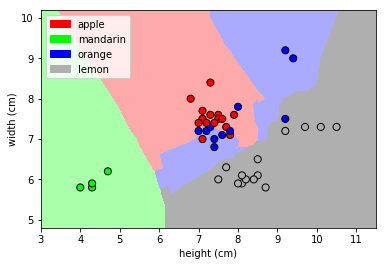

In [22]:
from adspy_shared_utilities import plot_fruit_knn

plot_fruit_knn(X_train, y_train, 5, 'uniform')   # 5 nearest neighbors

## Variation of k-NN Algorithm accuracy for different 'k' parameter

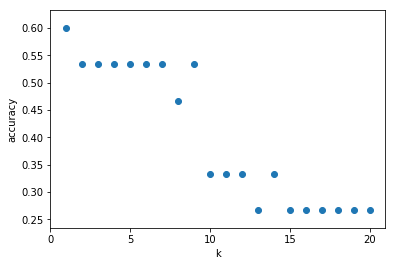

In [23]:
k_values = np.arange(1,21)
scores = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    scores.append(knn.score(X_test, y_test))

plt.figure()
plt.xlabel('k')
plt.ylabel('accuracy')
plt.scatter(k_values, scores)
plt.xticks([0,5,10,15,20]);

## Finding the Best train/test split proportion

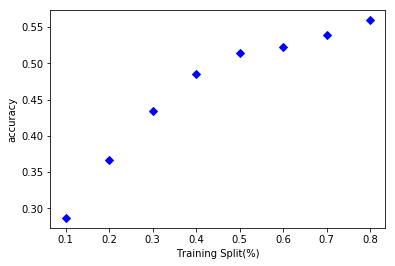

In [24]:
tsplit = np.arange(0.2,1.0,0.1)

knn = KNeighborsClassifier(n_neighbors = 5)

plt.figure()

for percent in tsplit:

    scores = []
    for i in range(1,1000):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = percent)
        knn.fit(X_train, y_train)
        scores.append(knn.score(X_test, y_test))
    plt.plot((1-percent), np.mean(scores), 'bD')

plt.xlabel('Training Split(%)')
plt.ylabel('accuracy');

# Applied Machine Learning: Module 2 (Supervised Learning, Part I)

## Preamble and Review

In [213]:
%matplotlib notebook
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

np.set_printoptions(precision=2)


fruits = pd.read_table('Data/fruit_data_with_colors.txt')

feature_names_fruits = ['height', 'width', 'mass', 'color_score']
X_fruits = fruits[feature_names_fruits]
y_fruits = fruits['fruit_label']
target_names_fruits = ['apple', 'mandarin', 'orange', 'lemon']

X_fruits_2d = fruits[['height', 'width']]
y_fruits_2d = fruits['fruit_label']

X_train, X_test, y_train, y_test = train_test_split(X_fruits, y_fruits, random_state=0)

In [26]:
X_train.head()

,height,width,mass,color_score
42,7.2,7.2,154,0.82
48,10.1,7.3,174,0.72
7,4.0,5.8,76,0.81
14,7.3,7.6,152,0.69
32,7.0,7.2,164,0.80


In [27]:
X_test.head()

,height,width,mass,color_score
26,9.2,9.6,362,0.74
35,7.9,7.1,150,0.75
43,10.3,7.2,194,0.70
28,7.1,6.7,140,0.72
11,7.6,7.1,172,0.92


In [28]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [29]:
pd.DataFrame(X_train_scaled, columns=feature_names_fruits)

,height,width,mass,color_score
0,0.492308,0.411765,0.278571,0.729730
1,0.938462,0.441176,0.350000,0.459459
2,0.000000,0.000000,0.000000,0.702703
3,0.507692,0.529412,0.271429,0.378378
4,0.461538,0.411765,0.314286,0.675676
5,0.723077,0.000000,0.200000,0.486486
6,0.523077,0.352941,0.300000,0.702703
7,0.507692,0.441176,0.278571,0.648649
8,0.630769,0.029412,0.142857,0.486486
9,0.476923,0.500000,0.307143,0.756757


In [30]:
pd.DataFrame(X_test_scaled, columns=feature_names_fruits)

,height,width,mass,color_score
0,0.800000,1.117647,1.021429,0.513514
1,0.600000,0.382353,0.264286,0.540541
2,0.969231,0.411765,0.421429,0.405405
3,0.476923,0.264706,0.228571,0.459459
4,0.553846,0.382353,0.342857,1.000000
5,0.492308,0.470588,0.357143,0.135135
6,0.584615,0.529412,0.235714,0.540541
7,0.953846,0.441176,0.500000,0.432432
8,0.538462,0.382353,0.278571,0.621622
9,0.476923,0.441176,0.228571,0.864865


In [31]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='uniform')

In [32]:
print('Accuracy of K-NN classifier on training set: {:.2f}'.format(knn.score(X_train_scaled, y_train)))

print('Accuracy of K-NN classifier on test set: {:.2f}'.format(knn.score(X_test_scaled, y_test)))

Accuracy of K-NN classifier on training set: 0.95
Accuracy of K-NN classifier on test set: 1.00


In [33]:
example_fruit = [[5.5, 2.2, 10, 0.70]]
print('Predicted fruit type for ', example_fruit, ' is ', target_names_fruits[knn.predict(example_fruit)[0]-1])

Predicted fruit type for  [[5.5, 2.2, 10, 0.7]]  is  orange


# Creating Synthetics Datasets

## Dataset loading utilities in scikitlearn
https://scikit-learn.org/stable/datasets/index.html
## See 5.4. Generated datasets in the documentation to see properties for creating artificial datasets

In [196]:
%matplotlib notebook
from sklearn.datasets import make_blobs, make_classification
from matplotlib.colors import ListedColormap
from sklearn.datasets import load_breast_cancer
from adspy_shared_utilities import load_crime_dataset

In [197]:
cmap_bold = ListedColormap(['#FFFF00', '#00FF00', '#0000FF','#000000'])

### synthetic dataset for simple regression

<IPython.core.display.Javascript object>


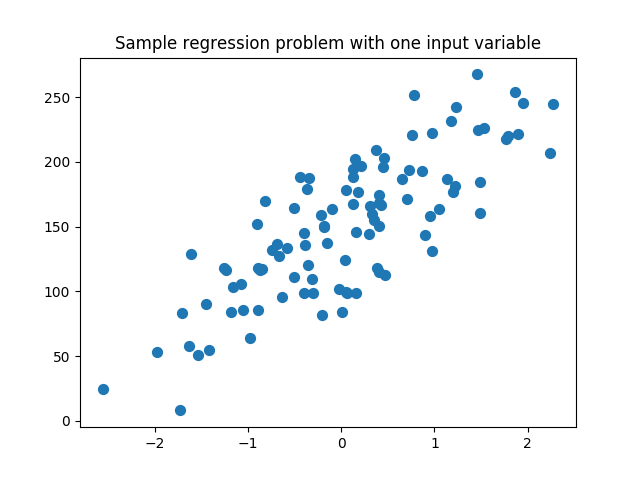

In [198]:
from sklearn.datasets import make_regression
plt.figure()
plt.title('Sample regression problem with one input variable')
X_R1, y_R1 = make_regression(n_samples = 100, n_features=1,
                            n_informative=1, bias = 150.0,
                            noise = 30, random_state=0)
plt.scatter(X_R1, y_R1, marker= 'o', s=50)
plt.show()

### synthetic dataset for more complex regression

<IPython.core.display.Javascript object>


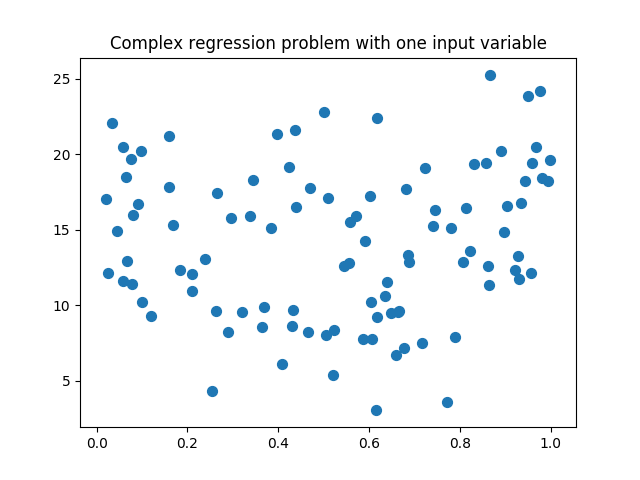

In [199]:
from sklearn.datasets import make_friedman1
plt.figure()
plt.title('Complex regression problem with one input variable')
X_F1, y_F1 = make_friedman1(n_samples = 100,
                           n_features = 7, random_state=0)

plt.scatter(X_F1[:, 2], y_F1, marker= 'o', s=50)
plt.show()

### synthetic dataset for classification (binary) 

<IPython.core.display.Javascript object>


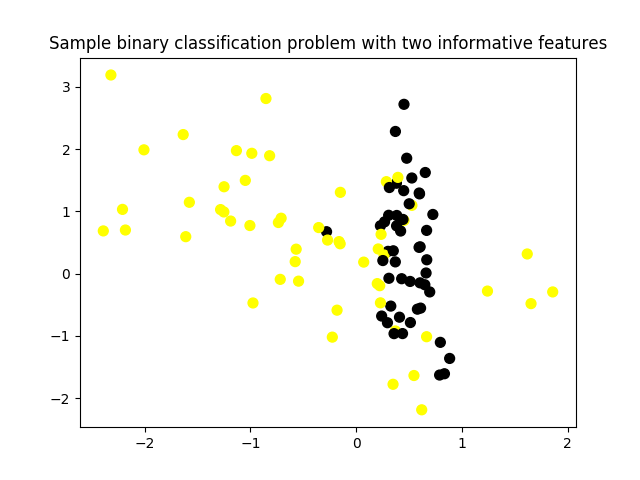

In [200]:
plt.figure()
plt.title('Sample binary classification problem with two informative features')
X_C2, y_C2 = make_classification(n_samples = 100, n_features=2,
                                n_redundant=0, n_informative=2,
                                n_clusters_per_class=1, flip_y = 0.1,
                                class_sep = 0.5, random_state=0)
plt.scatter(X_C2[:, 0], X_C2[:, 1], c=y_C2,
           marker= 'o', s=50, cmap=cmap_bold)
plt.show()

### more difficult synthetic dataset for classification (binary) with classes that are not linearly separable

<IPython.core.display.Javascript object>


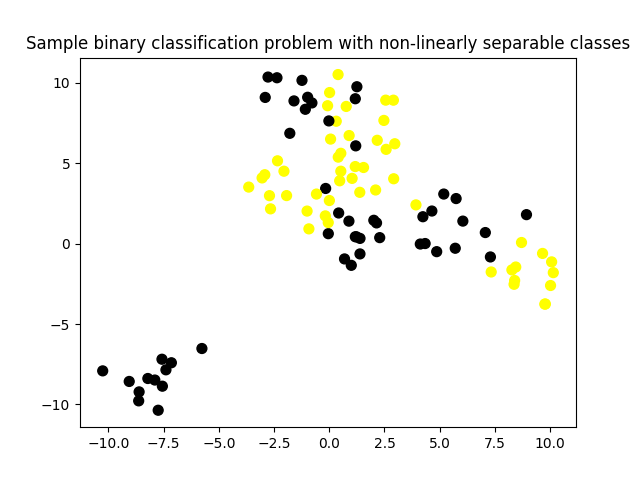

In [201]:
X_D2, y_D2 = make_blobs(n_samples = 100, n_features = 2, centers = 8, cluster_std = 1.3, random_state = 0)
y_D2 = y_D2 % 2
plt.figure()
plt.title('Sample binary classification problem with non-linearly separable classes')
plt.scatter(X_D2[:,0], X_D2[:,1], c=y_D2, marker= 'o', s=50, cmap=cmap_bold)
plt.show()

### Breast cancer dataset for classification

In [202]:
cancer = load_breast_cancer()
(X_cancer, y_cancer) = load_breast_cancer(return_X_y = True)

### Communities and Crime dataset

In [203]:
from adspy_shared_utilities import load_crime_dataset
(X_crime, y_crime) = load_crime_dataset()

# K Nearest Neighnours 

### Classification

<IPython.core.display.Javascript object>


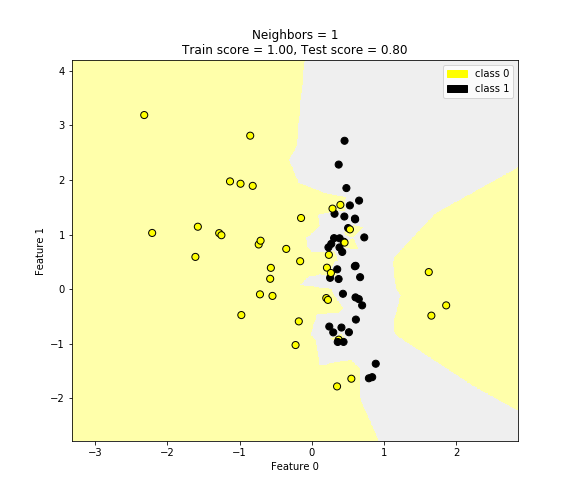

<IPython.core.display.Javascript object>


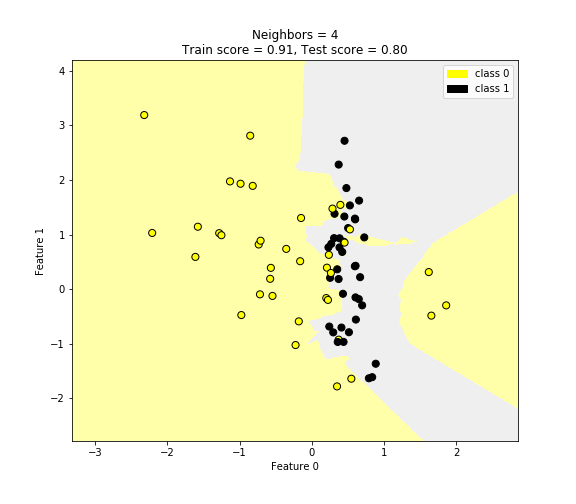

<IPython.core.display.Javascript object>


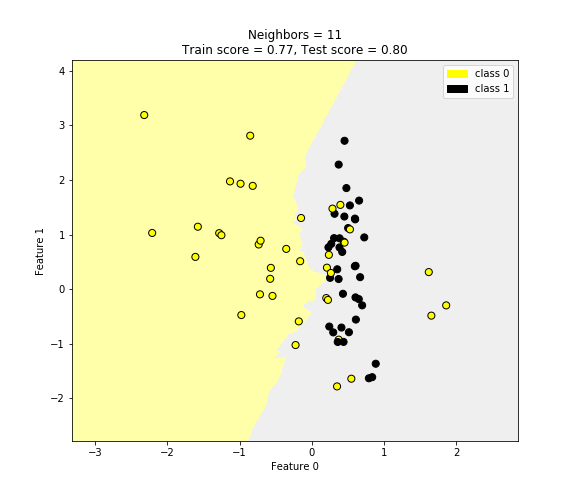

<IPython.core.display.Javascript object>


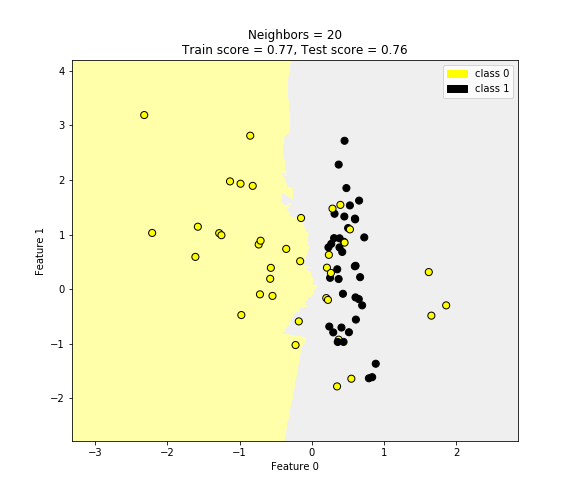

<IPython.core.display.Javascript object>


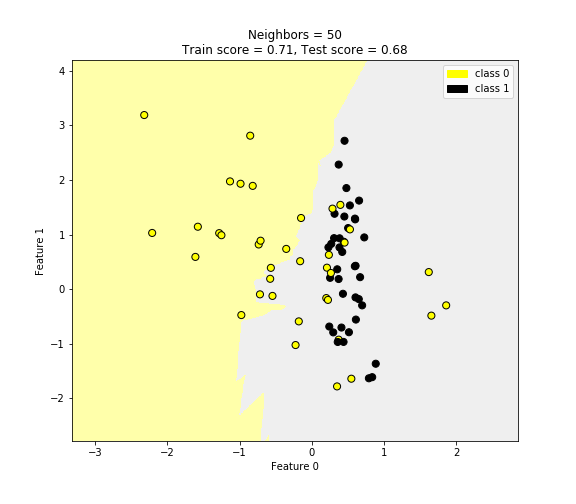

In [42]:
from adspy_shared_utilities import plot_two_class_knn

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state=0)

plot_two_class_knn(X=X_train, y=y_train, n_neighbors=1, weights="uniform", X_test=X_test, y_test=y_test)
plot_two_class_knn(X=X_train, y=y_train, n_neighbors=4, weights="uniform", X_test=X_test, y_test=y_test)
plot_two_class_knn(X=X_train, y=y_train, n_neighbors=11, weights="uniform", X_test=X_test, y_test=y_test)
plot_two_class_knn(X=X_train, y=y_train, n_neighbors=20, weights="uniform", X_test=X_test, y_test=y_test)
plot_two_class_knn(X=X_train, y=y_train, n_neighbors=50, weights="uniform", X_test=X_test, y_test=y_test)

### Regression

### Training the K Neighbors Regressor Model

In [43]:
from sklearn.neighbors import KNeighborsRegressor

X_train, X_test, y_train, y_test = train_test_split(X_R1, y_R1, random_state=0)

knnreg = KNeighborsRegressor(n_neighbors=5)
knnreg.fit(X_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=5, p=2,
          weights='uniform')

### Testing the KNR Model

In [44]:
print(knnreg.predict(X_test))
print('R-squared test score: {:.3f}'.format(knnreg.score(X_test, y_test)))

[231.71 148.36 150.59 150.59  72.15 166.51 141.91 235.57 208.26 102.1
 191.32 134.5  228.32 148.36 159.17 113.47 144.04 199.23 143.19 166.51
 231.71 208.26 128.02 123.14 141.91]
R-squared test score: 0.425


<IPython.core.display.Javascript object>


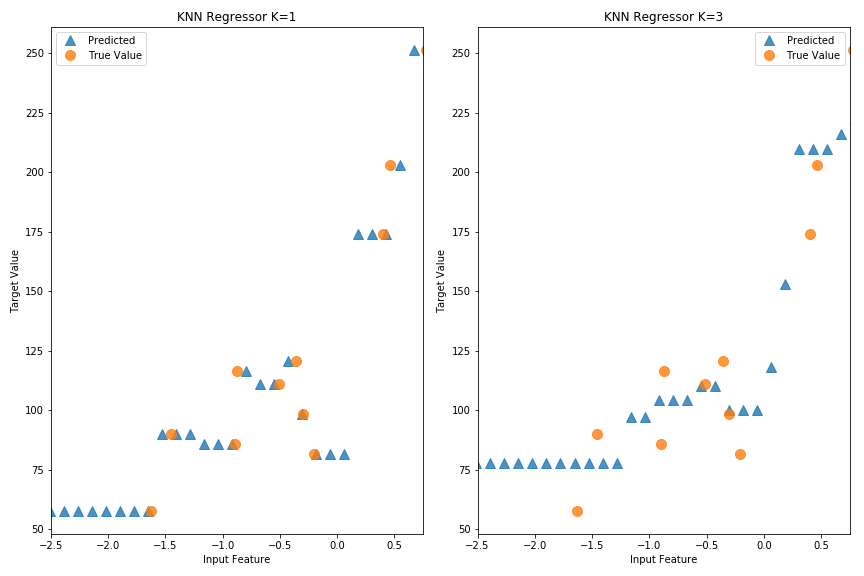

In [45]:
fig, subaxes = plt.subplots(1,2, figsize=(12,8))
X_predict_input = np.linspace(-3, 3, 50).reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X_R1[0::5], y_R1[0::5], random_state=0)

for thisaxis, K in zip(subaxes, [1,3]):
    knn = KNeighborsRegressor(n_neighbors=K).fit(X_train, y_train)
    y_predict = knn.predict(X_predict_input)
    thisaxis.set_xlim([-2.5, 0.75])
    thisaxis.plot(X_predict_input, y_predict, '^', markersize = 10, label = "Predicted", alpha = 0.8)
    thisaxis.plot(X_train, y_train, 'o', markersize=10, label = "True Value", alpha = 0.8)
    thisaxis.set_xlabel('Input Feature')
    thisaxis.set_ylabel('Target Value')
    thisaxis.set_title('KNN Regressor K={}'.format(K))
    thisaxis.legend()
plt.tight_layout()    

<IPython.core.display.Javascript object>


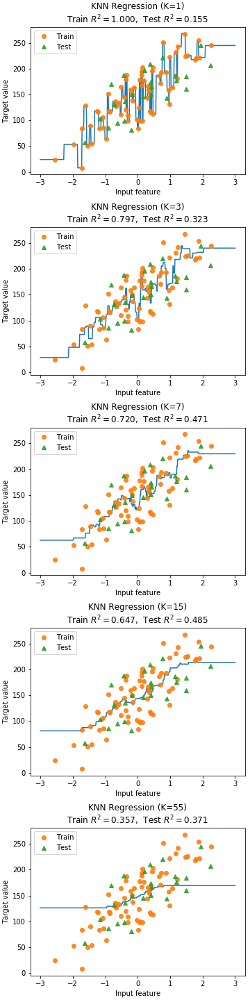

In [46]:
fig, subaxes = plt.subplots(5,1,figsize=(5,20))
X_predict_input = np.linspace(-3, 3, 500).reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X_R1, y_R1,
                                                   random_state = 0)
nok = []
Rsq_train = []
Rsq_test = []
for thisaxis, K in zip(subaxes, [1, 3, 7, 15, 55]):
    knnreg = KNeighborsRegressor(n_neighbors = K).fit(X_train, y_train)
    y_predict_output = knnreg.predict(X_predict_input)
    train_score = knnreg.score(X_train, y_train)
    test_score = knnreg.score(X_test, y_test)
    thisaxis.plot(X_predict_input, y_predict_output)
    thisaxis.plot(X_train, y_train, 'o', alpha=0.9, label='Train')
    thisaxis.plot(X_test, y_test, '^', alpha=0.9, label='Test')
    thisaxis.set_xlabel('Input feature')
    thisaxis.set_ylabel('Target value')
    thisaxis.set_title('KNN Regression (K={})\nTrain $R^2 = {:.3f}$,  Test $R^2 = {:.3f}$'
                      .format(K, train_score, test_score))
    nok.append(K)
    Rsq_train.append(train_score)
    Rsq_test.append(test_score)
    thisaxis.legend()
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

In [47]:
np.max(Rsq_test)

0.48493932421593966

# Linear Models for Regression 

### Linear Regression

In [48]:
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = train_test_split(X_R1, y_R1, random_state = 0)

linreg = LinearRegression().fit(X_train, y_train)

In [49]:
print('linear model coeff (w)    : {}'.format(linreg.coef_))
print('linear model intercept (b): {:.3f}'.format(linreg.intercept_))
print('R-squared score (training): {:.3f}'.format(linreg.score(X_train, y_train)))
print('R-squared score (test)    : {:.3f}'.format(linreg.score(X_test, y_test)))

linear model coeff (w)    : [45.71]
linear model intercept (b): 148.446
R-squared score (training): 0.679
R-squared score (test)    : 0.492


### Linear Regression Example Plot

<IPython.core.display.Javascript object>


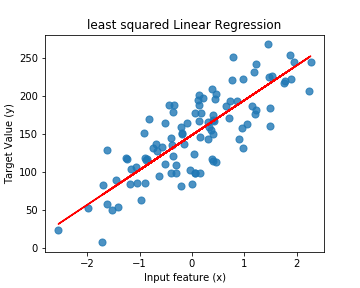

In [50]:
y_pred = (linreg.coef_*X_R1) + linreg.intercept_               # y = mx + c or y = Wx + b whatever  

plt.figure(figsize=(5,4))
plt.scatter(X_R1, y_R1, marker='o', s=50, alpha=0.8)           # x,y actual data
plt.plot(X_R1, y_pred, 'r-')                                   # x,y predicted data based on model (linear regression)
plt.title('least squared Linear Regression')
plt.xlabel('Input feature (x)')
plt.ylabel('Target Value (y)')
plt.show()

### Another example of Linear Regression

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime, random_state = 0)
linreg = LinearRegression().fit(X_train, y_train)

print('Crime dataset')
print('linear model intercept: {}'.format(linreg.intercept_))
print('linear model coeff:\n{}'.format(linreg.coef_))
print('R-squared score (training): {:.3f}'.format(linreg.score(X_train, y_train)))
print('R-squared score (test): {:.3f}'.format(linreg.score(X_test, y_test)))

Crime dataset
linear model intercept: -1728.1306726029839
linear model coeff:
[ 1.62e-03 -9.43e+01  1.36e+01 -3.13e+01 -8.15e-02 -1.69e+01 -2.43e-03
  1.53e+00 -1.39e-02 -7.72e+00  2.28e+01 -5.66e+00  9.35e+00  2.07e-01
 -7.43e+00  9.66e-03  4.38e-03  4.80e-03 -4.46e+00 -1.61e+01  8.83e+00
 -5.07e-01 -1.42e+00  8.18e+00 -3.87e+00 -3.54e+00  4.49e+00  9.31e+00
  1.74e+02  1.18e+01  1.51e+02 -3.30e+02 -1.35e+02  6.95e-01 -2.38e+01
  2.77e+00  3.82e-01  4.39e+00 -1.06e+01 -4.92e-03  4.14e+01 -1.16e-03
  1.19e+00  1.75e+00 -3.68e+00  1.60e+00 -8.42e+00 -3.80e+01  4.74e+01
 -2.51e+01 -2.88e-01 -3.66e+01  1.90e+01 -4.53e+01  6.83e+02  1.04e+02
 -3.29e+02 -3.14e+01  2.74e+01  5.12e+00  6.92e+01  1.98e-02 -6.12e-01
  2.65e+01  1.01e+01 -1.59e+00  2.24e+00  7.38e+00 -3.14e+01 -9.78e-05
  5.02e-05 -3.48e-04 -2.50e-04 -5.27e-01 -5.17e-01 -4.10e-01  1.16e-01
  1.46e+00 -3.04e-01  2.44e+00 -3.66e+01  1.41e-01  2.89e-01  1.77e+01
  5.97e-01  1.98e+00 -1.36e-01 -1.85e+00]
R-squared score (training): 

## Ridge Regression 

In [64]:
from sklearn.linear_model import Ridge

X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime, random_state = 0)

linridge = Ridge(alpha=20.0).fit(X_train, y_train)

print('Crime dataset')
print('ridge regression linear model intercept: {}'.format(linridge.intercept_))
print('ridge regression linear model coeff:\n{}'.format(linridge.coef_))
print('R-squared score (training): {:.3f}'.format(linridge.score(X_train, y_train)))
print('R-squared score (test): {:.3f}'.format(linridge.score(X_test, y_test)))
print('Number of non-zero features: {}'.format(np.sum(linridge.coef_ != 0)))

Crime dataset
ridge regression linear model intercept: -3352.423035845952
ridge regression linear model coeff:
[ 1.95e-03  2.19e+01  9.56e+00 -3.59e+01  6.36e+00 -1.97e+01 -2.81e-03
  1.66e+00 -6.61e-03 -6.95e+00  1.72e+01 -5.63e+00  8.84e+00  6.79e-01
 -7.34e+00  6.70e-03  9.79e-04  5.01e-03 -4.90e+00 -1.79e+01  9.18e+00
 -1.24e+00  1.22e+00  1.03e+01 -3.78e+00 -3.73e+00  4.75e+00  8.43e+00
  3.09e+01  1.19e+01 -2.05e+00 -3.82e+01  1.85e+01  1.53e+00 -2.20e+01
  2.46e+00  3.29e-01  4.02e+00 -1.13e+01 -4.70e-03  4.27e+01 -1.23e-03
  1.41e+00  9.35e-01 -3.00e+00  1.12e+00 -1.82e+01 -1.55e+01  2.42e+01
 -1.32e+01 -4.20e-01 -3.60e+01  1.30e+01 -2.81e+01  4.39e+01  3.87e+01
 -6.46e+01 -1.64e+01  2.90e+01  4.15e+00  5.34e+01  1.99e-02 -5.47e-01
  1.24e+01  1.04e+01 -1.57e+00  3.16e+00  8.78e+00 -2.95e+01 -2.33e-04
  3.14e-04 -4.13e-04 -1.80e-04 -5.74e-01 -5.18e-01 -4.21e-01  1.53e-01
  1.33e+00  3.85e+00  3.03e+00 -3.78e+01  1.38e-01  3.08e-01  1.57e+01
  3.31e-01  3.36e+00  1.61e-01 -2.68e

### Ridge Regression with feature Normalization

In [65]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime, random_state = 0)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

from sklearn.linear_model import Ridge
linridge = Ridge(alpha=20.0).fit(X_train_scaled, y_train)

print('Crime dataset')
print('ridge regression linear model intercept: {}'.format(linridge.intercept_))
print('ridge regression linear model coeff:\n{}'.format(linridge.coef_))
print('R-squared score (training): {:.3f}'.format(linridge.score(X_train, y_train)))
print('R-squared score (test): {:.3f}'.format(linridge.score(X_test, y_test)))
print('Number of non-zero features: {}'.format(np.sum(linridge.coef_ != 0)))

Crime dataset
ridge regression linear model intercept: 933.3906385044188
ridge regression linear model coeff:
[  88.69   16.49  -50.3   -82.91  -65.9    -2.28   87.74  150.95   18.88
  -31.06  -43.14 -189.44   -4.53  107.98  -76.53    2.86   34.95   90.14
   52.46  -62.11  115.02    2.67    6.94   -5.67 -101.55  -36.91   -8.71
   29.12  171.26   99.37   75.07  123.64   95.24 -330.61 -442.3  -284.5
 -258.37   17.66 -101.71  110.65  523.14   24.82    4.87  -30.47   -3.52
   50.58   10.85   18.28   44.11   58.34   67.09  -57.94  116.14   53.81
   49.02   -7.62   55.14  -52.09  123.39   77.13   45.5   184.91  -91.36
    1.08  234.09   10.39   94.72  167.92  -25.14   -1.18   14.6    36.77
   53.2   -78.86   -5.9    26.05  115.15   68.74   68.29   16.53  -97.91
  205.2    75.97   61.38  -79.83   67.27   95.67  -11.88]
R-squared score (training): -3218104518.645
R-squared score (test): -14804941388.786
Number of non-zero features: 88


### Ridge Regression with Regularization parameter alpha

In [66]:
print('Ridge regression: effect of alpha regularization parameter\n')
for this_alpha in [0, 1, 10, 20, 50, 100, 1000]:
    linridge = Ridge(alpha = this_alpha).fit(X_train_scaled, y_train)
    r2_train = linridge.score(X_train_scaled, y_train)
    r2_test = linridge.score(X_test_scaled, y_test)
    num_coeff_bigger = np.sum(abs(linridge.coef_) > 1.0)
    print('Alpha = {:.2f}\nnum abs(coeff) > 1.0: {}, r-squared training: {:.2f}, r-squared test: {:.2f}\n'
         .format(this_alpha, num_coeff_bigger, r2_train, r2_test))

Ridge regression: effect of alpha regularization parameter

Alpha = 0.00
num abs(coeff) > 1.0: 88, r-squared training: 0.67, r-squared test: 0.51

Alpha = 1.00
num abs(coeff) > 1.0: 87, r-squared training: 0.66, r-squared test: 0.56

Alpha = 10.00
num abs(coeff) > 1.0: 87, r-squared training: 0.63, r-squared test: 0.59

Alpha = 20.00
num abs(coeff) > 1.0: 88, r-squared training: 0.61, r-squared test: 0.60

Alpha = 50.00
num abs(coeff) > 1.0: 86, r-squared training: 0.58, r-squared test: 0.58

Alpha = 100.00
num abs(coeff) > 1.0: 87, r-squared training: 0.55, r-squared test: 0.55

Alpha = 1000.00
num abs(coeff) > 1.0: 84, r-squared training: 0.31, r-squared test: 0.30



In [67]:
## for Alpha = 20, R-squared test value is best - 0.60 (max)

## Lasso Regression

In [55]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.preprocessing import MinMaxScaler

scalar = MinMaxScaler()
X_train, X_test, y_train, y_test = train_test_split(X_crime, y_crime, random_state = 0)


X_train_scaled  = scalar.fit_transform(X_train)
X_test_scaled  = scalar.transform(X_test)

pd.DataFrame(X_train_scaled)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87
0,0.003198,0.309278,0.184119,0.242140,0.128324,0.275543,0.006062,1.0000,0.124687,0.558881,0.066456,0.345125,0.426789,0.275076,0.387872,0.152761,0.115078,0.003969,0.249481,0.177592,0.387312,0.107927,0.252777,0.504352,0.590706,0.210746,0.530218,0.202609,0.527534,0.239651,0.494779,0.565725,0.322430,0.678129,0.685121,0.732818,0.694961,0.412746,0.377056,0.001696,0.085986,0.000337,0.062063,0.052390,0.049375,0.045341,0.006939,0.004516,0.003552,0.002758,0.945492,0.015102,0.082349,0.068705,0.320000,0.386282,0.152381,0.655034,0.021902,0.428479,0.666667,0.004787,0.937429,0.581962,0.058160,0.479777,0.354167,0.185116,0.060038,0.041503,0.044782,0.057630,0.083384,0.130820,0.183882,0.200244,0.160648,0.174289,0.439153,0.062500,0.120301,0.000000,0.000000,0.034374,0.781100,0.766822,0.932838,0.945132
1,0.001662,0.625430,0.280614,0.361037,0.200206,0.180039,0.000000,0.0000,0.112022,0.656868,0.362342,0.270553,0.327591,0.527356,0.206659,0.100425,0.061207,0.005227,0.452055,0.670737,0.653989,0.098375,0.628165,0.500502,0.186101,0.201633,0.348177,0.136144,0.228411,0.344849,0.339632,0.312039,0.607477,0.659550,0.614262,0.622939,0.667816,0.553580,0.512864,0.003402,0.231501,0.003336,0.386063,0.503939,0.563792,0.599886,0.543562,0.546914,0.510655,0.459393,0.454056,0.503844,0.483243,0.444864,0.643636,0.577617,0.619048,0.445514,0.375068,0.545189,0.333333,0.001345,0.966033,0.479058,0.051141,0.358569,0.645833,0.317209,0.110694,0.094156,0.101183,0.126915,0.103323,0.188470,0.269012,0.291819,0.189290,0.295426,0.682540,0.454545,0.067669,0.000000,0.000000,0.468615,0.501466,0.500225,0.749272,0.852542
2,0.015818,0.340206,0.179792,0.320736,0.164522,0.189933,0.018641,1.0000,0.279985,0.779975,0.117089,0.504499,0.253490,0.189210,0.277051,0.335957,0.261259,0.005569,0.110419,0.102828,0.175457,0.468919,0.226566,0.726314,0.346195,0.334726,0.143626,0.521887,0.366708,0.380019,0.381900,0.417076,0.313084,0.726695,0.737927,0.749599,0.669166,0.667821,0.683889,0.006012,0.124018,0.005670,0.321512,0.416098,0.510209,0.530682,0.186584,0.186152,0.190213,0.167331,0.835613,0.091159,0.084264,0.065613,0.312727,0.415162,0.158730,0.519454,0.046724,0.495232,0.666667,0.015184,0.936941,0.429546,0.036851,0.202878,0.479167,0.094419,0.091932,0.293413,0.333966,0.422404,0.225378,0.350333,0.574347,0.702076,0.425903,0.621755,0.502646,0.414773,0.263158,0.019650,0.000000,0.191299,0.640169,0.653979,0.736597,0.818548
3,0.007420,0.319588,0.179792,0.290134,0.121633,0.092708,0.010271,1.0000,0.274193,0.878675,0.083861,0.540984,0.110930,0.055851,0.147444,0.311503,0.254887,0.001869,0.062059,0.035133,0.057792,0.533932,0.067970,0.857717,0.347048,0.174483,0.153658,0.518671,0.554443,0.291783,0.591745,0.635749,0.331776,0.760430,0.802166,0.838757,0.750450,0.628639,0.626318,0.001310,0.056222,0.002544,0.328823,0.365284,0.451306,0.490000,0.155744,0.133467,0.137727,0.126571,0.899601,0.045854,0.086179,0.066987,0.334545,0.415162,0.180952,0.558765,0.039241,0.482228,0.666667,0.009488,0.927353,0.481600,0.009276,0.008167,0.833333,0.032558,0.028143,0.247986,0.299957,0.378588,0.230514,0.451220,0.538025,0.605617,0.214197,0.579728,0.449735,0.363636,0.135338,0.000000,0.000000,0.155928,0.374839,0.375693,0.588287,0.653049
4,0.001732,0.319588,0.158589,0.207023,0.093498,0.295763,0.004589,1.0000,0.226695,0.616604,0.115506,0.680143,0.413870,0.114742,0.389298,0.263669,0.193886,0.000951,0.077833,0.098543,0.181548,0.379812,0.078632,0.634416,0.286080,0.356560,0.169807,0.495623,0.262203,0.199502,0.272004,0.297297,0.345794,0.857073,0.878141,0.911280,0.870126,0.670653,0.648250,0.000254,0.019016,0.000072,0.077150,0.065126,0.153446,0.140909,0.003084,0.002007,0.003552,0.002758,0.982333,0.017573,0.108203,0.087942,0.327273,0.415162,0.069841,0.770959,0.007666,0.441049,0.666667,0.002024,0.965870,0.668808,0

In [56]:
pd.DataFrame(X_test_scaled)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87
0,0.001009,0.515464,0.209000,0.319398,0.158003,0.241772,0.000000,0.0000,0.105472,0.534830,0.061709,0.324048,0.432581,0.372340,0.459929,0.133209,0.102919,0.002293,0.276671,0.227292,0.444808,0.119190,0.350955,0.329428,0.228096,0.510917,0.332518,0.257817,0.415519,0.481637,0.501740,0.496929,0.378505,0.592568,0.621333,0.799650,0.752400,0.780960,0.697596,0.001442,0.123191,0.000495,0.088350,0.116597,0.221507,0.301023,0.022359,0.022579,0.035912,0.041373,0.909081,0.050522,0.140760,0.113020,0.360000,0.425993,0.206349,0.578420,0.021172,0.440074,0.666667,0.002508,0.930603,0.511575,0.164954,0.602152,0.000000,0.273953,0.110694,0.024984,0.026193,0.038204,0.080363,0.117517,0.165721,0.173382,0.148194,0.164400,0.428571,0.244318,0.218045,0.000000,0.000000,0.081368,0.915817,0.640342,0.748980,0.931266
1,0.044267,0.316151,0.278884,0.382776,0.244124,0.239191,0.047013,1.0000,0.086266,0.554784,0.049051,0.361395,0.361152,0.461626,0.320095,0.121050,0.105296,0.053320,0.457866,0.232862,0.397415,0.263616,0.304309,0.488617,0.230015,0.475033,0.277465,0.351438,0.535044,0.550265,0.498757,0.572482,0.336449,0.316819,0.332782,0.357945,0.376725,0.500865,0.482075,0.055961,0.426623,0.007894,0.343133,0.381696,0.422472,0.427841,0.109483,0.094330,0.086819,0.074471,0.893784,0.047501,0.168209,0.105806,0.272727,0.342960,0.184127,0.313545,0.048732,0.547464,0.333333,0.079021,0.867219,0.260003,0.109301,0.301011,0.000000,0.397209,0.093809,0.075779,0.086607,0.108137,0.103927,0.182927,0.257662,0.295482,0.199253,0.268232,0.708995,0.340909,0.345865,0.086501,0.016726,0.104118,0.757181,0.518358,0.742861,0.828537
2,0.002414,0.333333,0.146473,0.244816,0.101561,0.294042,0.005280,1.0000,0.201742,0.647604,0.028481,0.446937,0.441491,0.213146,0.323900,0.225985,0.165263,0.002041,0.144251,0.230720,0.372456,0.128743,0.276766,0.622698,0.581539,0.195367,0.381698,0.200286,0.335419,0.290227,0.363003,0.390049,0.341121,0.641623,0.637731,0.663067,0.620726,0.596696,0.665753,0.003392,0.215792,0.001027,0.095660,0.141807,0.203564,0.210568,0.036237,0.041144,0.049329,0.043212,0.843800,0.038166,0.083307,0.072827,0.360000,0.400722,0.247619,0.527076,0.028837,0.510511,0.333333,0.003732,0.941817,0.483474,0.080221,0.511926,0.187500,0.137674,0.212008,0.237662,0.270173,0.305201,0.142900,0.226164,0.355278,0.446886,0.305106,0.431397,0.391534,0.494318,0.428571,0.000000,0.000000,0.123215,0.794583,0.789300,0.862471,0.927389
3,0.017400,0.340206,0.248161,0.293478,0.172242,0.254894,0.020224,1.0000,0.087738,0.525922,0.049051,0.276840,0.394119,0.526976,0.416885,0.111061,0.093189,0.021625,0.419884,0.205441,0.439459,0.105361,0.329631,0.474054,0.452142,0.328460,0.493516,0.216902,0.652691,0.292406,0.624068,0.710074,0.327103,0.500978,0.483226,0.497884,0.453059,0.555311,0.494939,0.013452,0.206697,0.000554,0.239851,0.262605,0.278183,0.306023,0.013107,0.011039,0.009471,0.008888,0.979748,0.007688,0.127035,0.100653,0.323636,0.332130,0.263492,0.470250,0.038146,0.530126,0.333333,0.027617,0.888997,0.457246,0.211080,0.536687,0.145833,0.415814,0.108818,0.032211,0.032531,0.047269,0.082477,0.089800,0.144154,0.163614,0.169365,0.196539,0.603175,0.170455,0.225564,0.000427,0.002573,0.015111,0.829406,0.585494,0.827069,0.881318
4,0.005375,0.319588,0.184119,0.315719,0.148053,0.147559,0.008233,1.0000,0.168997,0.787458,0.050633,0.406385,0.227354,0.223784,0.231153,0.187067,0.150642,0.003950,0.179535,0.081834,0.174863,0.213430,0.143492,0.743053,0.299936,0.217581,0.286274,0.239057,0.668335,0.314037,0.727996,0.778256,0.327103,0.623370,0.657439,0.733985,0.559088,0.501180,0.568958,0.002332,0.100868,0.002262,0.363820,0.434217,0.511570,0.630795,0.191210,0.176116,0.173244,0.180815,0.887752,0.077155,0.120332,0.090003,0.334545,0.393502,0.228571,0.423720,0.088155,0.575531,0.333333,0.006107,0.942305,0.372675,0

In [57]:
linlasso = Lasso(alpha=2.0, max_iter=10000).fit(X_train_scaled, y_train)

print('Crime dataset')
print('lasso regression linear model intercept: {}'.format(linlasso.intercept_))
print('lasso regression linear model coeff:\n{}'.format(linlasso.coef_))
print('Non-zero features: {}'.format(np.sum(linlasso.coef_ != 0)))
print('R-squared score (training): {:.3f}'.format(linlasso.score(X_train_scaled, y_train)))
print('R-squared score (test): {:.3f}\n'.format(linlasso.score(X_test_scaled, y_test)))
print('Features with non-zero weight (sorted by absolute magnitude):')

for e in sorted (list(zip(list(X_crime), linlasso.coef_)),
                key = lambda e: -abs(e[1])):
    if e[1] != 0:
        print('\t{}, {:.3f}'.format(e[0], e[1]))

Crime dataset
lasso regression linear model intercept: 1186.6120619985786
lasso regression linear model coeff:
[    0.       0.      -0.    -168.18    -0.      -0.       0.     119.69
     0.      -0.       0.    -169.68    -0.       0.      -0.       0.
     0.       0.      -0.      -0.       0.      -0.       0.       0.
   -57.53    -0.      -0.       0.     259.33    -0.       0.       0.
     0.      -0.   -1188.74    -0.      -0.      -0.    -231.42     0.
  1488.37     0.      -0.      -0.      -0.       0.       0.       0.
     0.       0.      -0.       0.      20.14     0.       0.       0.
     0.       0.     339.04     0.       0.     459.54    -0.       0.
   122.69    -0.      91.41     0.      -0.       0.       0.      73.14
     0.      -0.       0.       0.      86.36     0.       0.       0.
  -104.57   264.93     0.      23.45   -49.39     0.       5.2      0.  ]
Non-zero features: 20
R-squared score (training): 0.631
R-squared score (test): 0.624

Features with 

In [58]:
pd.DataFrame(linlasso.coef_)

,0
0,0.000000
1,0.000000
2,-0.000000
3,-168.183461
4,-0.000000
5,-0.000000
6,0.000000
7,119.693819
8,0.000000
9,-0.000000


### Lasso Regression with Regularization Parameter - alpha 

In [59]:
print('Lasso regression: effect of alpha regularization\n\
parameter on number of features kept in final model\n')

for alpha in [0.5, 1, 2, 3, 5, 10, 20, 50]:
    linlasso = Lasso(alpha, max_iter = 10000).fit(X_train_scaled, y_train)
    r2_train = linlasso.score(X_train_scaled, y_train)
    r2_test = linlasso.score(X_test_scaled, y_test)
    
    print('Alpha = {:.2f}\nFeatures kept: {}, r-squared training: {:.2f}, r-squared test: {:.2f}\n'
         .format(alpha, np.sum(linlasso.coef_ != 0), r2_train, r2_test))

Lasso regression: effect of alpha regularization
parameter on number of features kept in final model

Alpha = 0.50
Features kept: 35, r-squared training: 0.65, r-squared test: 0.58

Alpha = 1.00
Features kept: 25, r-squared training: 0.64, r-squared test: 0.60

Alpha = 2.00
Features kept: 20, r-squared training: 0.63, r-squared test: 0.62

Alpha = 3.00
Features kept: 17, r-squared training: 0.62, r-squared test: 0.63

Alpha = 5.00
Features kept: 12, r-squared training: 0.60, r-squared test: 0.61

Alpha = 10.00
Features kept: 6, r-squared training: 0.57, r-squared test: 0.58

Alpha = 20.00
Features kept: 2, r-squared training: 0.51, r-squared test: 0.50

Alpha = 50.00
Features kept: 1, r-squared training: 0.31, r-squared test: 0.30



## Polynomial Regression

In [60]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_F1, y_F1, random_state = 0)

linreg = LinearRegression().fit(X_train, y_train)

print('linear model coeff (w): {}'.format(linreg.coef_))
print('linear model intercept (b): {:.3f}'.format(linreg.intercept_))
print('R-squared score (training): {:.3f}'.format(linreg.score(X_train, y_train)))
print('R-squared score (test): {:.3f}'.format(linreg.score(X_test, y_test)))

linear model coeff (w): [ 4.42  6.    0.53 10.24  6.55 -2.02 -0.32]
linear model intercept (b): 1.543
R-squared score (training): 0.722
R-squared score (test): 0.722


### Now we transform the original input data to add polynomial features up to degree 2 (quadratic)

In [61]:
poly = PolynomialFeatures(degree=2)
X_F1_poly = poly.fit_transform(X_F1)

X_train, X_test, y_train, y_test = train_test_split(X_F1_poly, y_F1, random_state = 0)
linreg = LinearRegression().fit(X_train, y_train)

print('(poly deg 2) linear model coeff (w):\n{}'.format(linreg.coef_))
print('(poly deg 2) linear model intercept (b): {:.3f}'.format(linreg.intercept_))
print('(poly deg 2) R-squared score (training): {:.3f}'.format(linreg.score(X_train, y_train)))
print('(poly deg 2) R-squared score (test): {:.3f}\n'.format(linreg.score(X_test, y_test)))

(poly deg 2) linear model coeff (w):
[ 3.41e-12  1.66e+01  2.67e+01 -2.21e+01  1.24e+01  6.93e+00  1.05e+00
  3.71e+00 -1.34e+01 -5.73e+00  1.62e+00  3.66e+00  5.05e+00 -1.46e+00
  1.95e+00 -1.51e+01  4.87e+00 -2.97e+00 -7.78e+00  5.15e+00 -4.65e+00
  1.84e+01 -2.22e+00  2.17e+00 -1.28e+00  1.88e+00  1.53e-01  5.62e-01
 -8.92e-01 -2.18e+00  1.38e+00 -4.90e+00 -2.24e+00  1.38e+00 -5.52e-01
 -1.09e+00]
(poly deg 2) linear model intercept (b): -3.206
(poly deg 2) R-squared score (training): 0.969
(poly deg 2) R-squared score (test): 0.805



### Addition of many polynomial features often leads to overfitting, so we often use polynomial features in combination with regression that has a regularization penalty, like ridge regression

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X_F1_poly, y_F1,
                                                   random_state = 0)
linreg = Ridge().fit(X_train, y_train)

print('(poly deg 2 + ridge) linear model coeff (w):\n{}'.format(linreg.coef_))
print('(poly deg 2 + ridge) linear model intercept (b): {:.3f}'.format(linreg.intercept_))
print('(poly deg 2 + ridge) R-squared score (training): {:.3f}'.format(linreg.score(X_train, y_train)))
print('(poly deg 2 + ridge) R-squared score (test): {:.3f}'.format(linreg.score(X_test, y_test)))

(poly deg 2 + ridge) linear model coeff (w):
[ 0.    2.23  4.73 -3.15  3.86  1.61 -0.77 -0.15 -1.75  1.6   1.37  2.52
  2.72  0.49 -1.94 -1.63  1.51  0.89  0.26  2.05 -1.93  3.62 -0.72  0.63
 -3.16  1.29  3.55  1.73  0.94 -0.51  1.7  -1.98  1.81 -0.22  2.88 -0.89]
(poly deg 2 + ridge) linear model intercept (b): 5.418
(poly deg 2 + ridge) R-squared score (training): 0.826
(poly deg 2 + ridge) R-squared score (test): 0.825


## Logistic Regression 

#### Logistic regression for binary classification on fruits dataset using height, width features (positive class: apple, negative class: others)

In [78]:
(y_fruits_2d == 1).values

array([ True,  True,  True, False, False, False, False, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False])

<IPython.core.display.Javascript object>


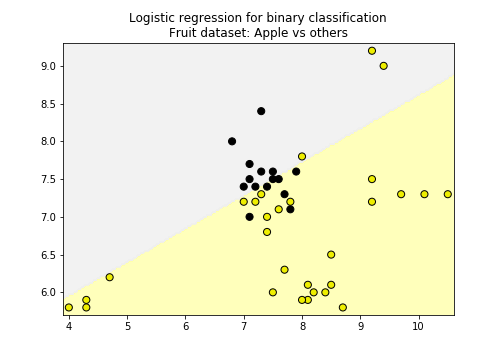

C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys


In [121]:
from sklearn.linear_model import LogisticRegression
from adspy_shared_utilities import (plot_class_regions_for_classifier_subplot)

fig, subaxes = plt.subplots(1,1, figsize=(7, 5))
y_fruits_apple = y_fruits_2d == 1

X_train, X_test, y_train, y_test = (train_test_split(X_fruits_2d.as_matrix(), y_fruits_apple.as_matrix(), random_state = 0))

clf = LogisticRegression(C=100).fit(X_train, y_train)

plot_class_regions_for_classifier_subplot(clf, X_train, y_train, None, None, 'Logistic regression for binary classification\nFruit dataset: Apple vs others',subaxes)

In [127]:
# h = 10
# w = 7
# ['not an apple', 'an apple'][clf.predict([[h,w]])[0]]
clf.predict([[h,w]])[0]

False

In [85]:
h = 6
w = 8
print('A fruit with height {} and width {} is predicted to be: {}'
     .format(h,w, ['not an apple', 'an apple'][clf.predict([[h,w]])[0]]))

h = 10
w = 7
print('A fruit with height {} and width {} is predicted to be: {}'
     .format(h,w, ['not an apple', 'an apple'][clf.predict([[h,w]])[0]]))
subaxes.set_xlabel('height')
subaxes.set_ylabel('width')

print('Accuracy of Logistic regression classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Logistic regression classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

A fruit with height 6 and width 8 is predicted to be: an apple
A fruit with height 10 and width 7 is predicted to be: not an apple
Accuracy of Logistic regression classifier on training set: 0.77
Accuracy of Logistic regression classifier on test set: 0.73


C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  after removing the cwd from sys.path.
C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  if __name__ == '__main__':


#### Logistic regression on simple synthetic dataset

<IPython.core.display.Javascript object>


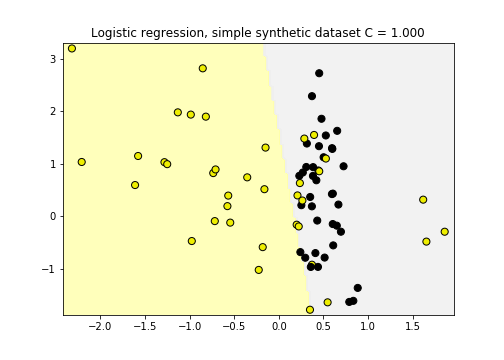

Accuracy of Logistic regression classifier on training set: 0.80
Accuracy of Logistic regression classifier on test set: 0.80


In [87]:
from sklearn.linear_model import LogisticRegression
from adspy_shared_utilities import (plot_class_regions_for_classifier_subplot)

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state = 0)
clf = LogisticRegression().fit(X_train, y_train)


fig, subaxes = plt.subplots(1,1,figsize=(7,5))
title = 'Logistic regression, simple synthetic dataset C = {:.3f}'.format(1.0)
plot_class_regions_for_classifier_subplot(clf, X_train, y_train, None, None, title, subaxes)

print('Accuracy of Logistic regression classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Logistic regression classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

In [128]:
pd.DataFrame({'height_scaled':X_C2[:,0],'weight_scaled':X_C2[:,1],'label':y_C2})

,height_scaled,weight_scaled,label
0,0.371640,-0.922762,0
1,-0.161718,0.513867,0
2,-1.636509,2.233900,0
3,0.620419,-2.189414,0
4,-0.987185,1.932995,0
5,-0.149185,1.305356,0
6,1.618788,0.314952,0
7,-2.007760,1.988570,0
8,0.510551,-0.126564,1
9,0.410029,-0.701190,1


#### Logistic regression regularization: C parameter

C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


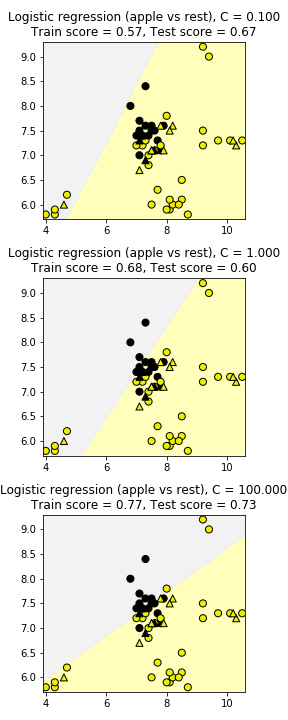

In [117]:
X_train, X_test, y_train, y_test = (train_test_split(X_fruits_2d.as_matrix(), y_fruits_apple.as_matrix(), random_state=0))

fig, subaxes = plt.subplots(3, 1, figsize=(4, 10))

for this_C, subplot in zip([0.1, 1, 100], subaxes):
    clf = LogisticRegression(C=this_C).fit(X_train, y_train)
    title ='Logistic regression (apple vs rest), C = {:.3f}'.format(this_C)
    
    plot_class_regions_for_classifier_subplot(clf, X_train, y_train, X_test, y_test, title, subplot)

plt.tight_layout()

In [116]:
#X_fruits_2d, y_fruits_apple
pd.DataFrame({'height':X_fruits_2d['height'],'width':X_fruits_2d['width'],'label':y_fruits_apple})

,height,width,label
0,7.3,8.4,True
1,6.8,8.0,True
2,7.2,7.4,True
3,4.7,6.2,False
4,4.6,6.0,False
5,4.3,5.8,False
6,4.3,5.9,False
7,4.0,5.8,False
8,7.8,7.1,True
9,7.0,7.4,True


### Application to real dataset

In [118]:
from sklearn.linear_model import LogisticRegression

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = LogisticRegression().fit(X_train, y_train)

print('Breast cancer dataset')
print('Accuracy of Logistic regression classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Logistic regression classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Breast cancer dataset
Accuracy of Logistic regression classifier on training set: 0.96
Accuracy of Logistic regression classifier on test set: 0.96


## Support Vector Machines

#### Linear Support Vector Machine

<IPython.core.display.Javascript object>


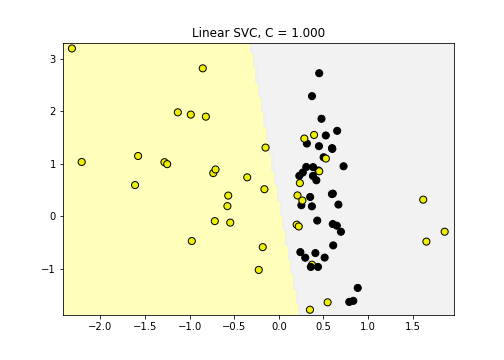

In [130]:
from sklearn.svm import SVC
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state = 0)

fig, subaxes = plt.subplots(1,1,figsize =(7,5))
this_C = 1.0
clf = SVC(kernel= 'linear', C=this_C).fit(X_train, y_train)
title = 'Linear SVC, C = {:.3f}'.format(this_C)
plot_class_regions_for_classifier_subplot(clf, X_train, y_train, None, None, title, subaxes)

#### Linear Support Vector Machine with a C parameter

<IPython.core.display.Javascript object>


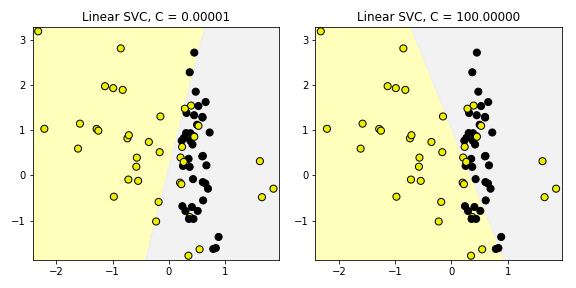

In [136]:
from sklearn.svm import LinearSVC
from adspy_shared_utilities import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state = 0)
fig, subaxes = plt.subplots(1, 2, figsize=(8, 4))

for this_C, subplot in zip([0.00001, 100], subaxes):
    clf = LinearSVC(C=this_C).fit(X_train, y_train)
    title = 'Linear SVC, C = {:.5f}'.format(this_C)
    #axis = axis.flatten()
    plot_class_regions_for_classifier_subplot(clf, X_train, y_train, None, None, title, subplot)

plt.tight_layout()

#### Application to a real dataset
https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_breast_cancer.html#sklearn.datasets.load_breast_cancer

In [137]:
from sklearn.svm import LinearSVC
X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = LinearSVC().fit(X_train, y_train)
print('Breast cancer dataset')
print('Accuracy of Linear SVC classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Linear SVC classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Breast cancer dataset
Accuracy of Linear SVC classifier on training set: 0.93
Accuracy of Linear SVC classifier on test set: 0.94


## Multi-class Classification with linear models

#### Linear Classifier with M Classes generates M (one vs rest classifiers)

In [151]:
from sklearn.svm import LinearSVC

X_train, X_test, y_train, y_test = train_test_split(X_fruits_2d, y_fruits_2d, random_state = 0)

clf = LinearSVC(C=5, random_state= 67).fit(X_train, y_train)
print('Coefficients:\n', clf.coef_)
print('Intercepts:\n', clf.intercept_)

Coefficients:
 [[-0.23  0.72]
 [-1.63  1.15]
 [ 0.08  0.31]
 [ 1.26 -1.68]]
Intercepts:
 [-3.32  1.2  -2.75  1.16]


#### Multi-class results on a fruit dataset

<IPython.core.display.Javascript object>


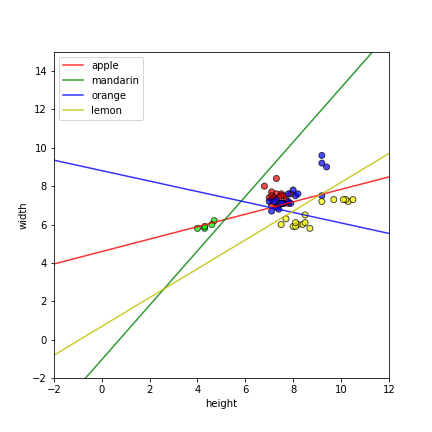

In [166]:
plt.figure(figsize=(6,6))
colors = ['r', 'g', 'b', 'y']
cmap_fruits = ListedColormap(['#FF0000', '#00FF00', '#0000FF','#FFFF00'])

plt.scatter(X_fruits_2d['height'], X_fruits_2d['width'], c=y_fruits_2d, cmap=cmap_fruits, edgecolor = 'black', alpha=.7)

import numpy as np
x_0_range = np.linspace(-10, 15)

for w, b, color in zip(clf.coef_, clf.intercept_, ['r', 'g', 'b', 'y']):
    # Since class prediction with a linear model uses the formula y = w_0 x_0 + w_1 x_1 + b, 
    # and the decision boundary is defined as being all points with y = 0, to plot x_1 as a 
    # function of x_0 we just solve w_0 x_0 + w_1 x_1 + b = 0 for x_1:
    plt.plot(x_0_range, -(x_0_range * w[0] + b) / w[1], c=color, alpha=.8)
    
plt.legend(target_names_fruits)
plt.xlabel('height')
plt.ylabel('width')
plt.xlim(-2, 12)
plt.ylim(-2, 15)
plt.show()

## Kernelized Support Vector Machines

### Classification

<IPython.core.display.Javascript object>


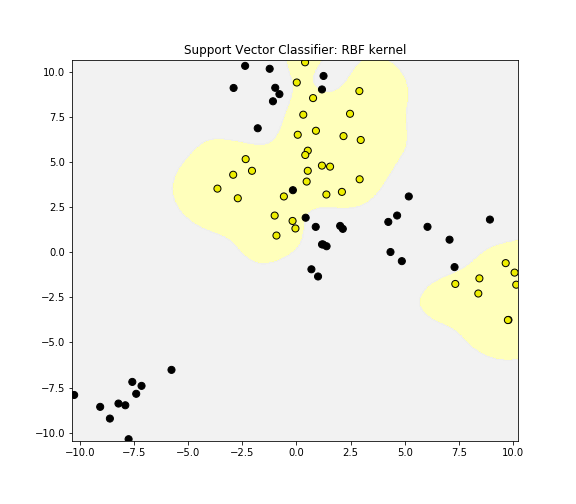

<IPython.core.display.Javascript object>


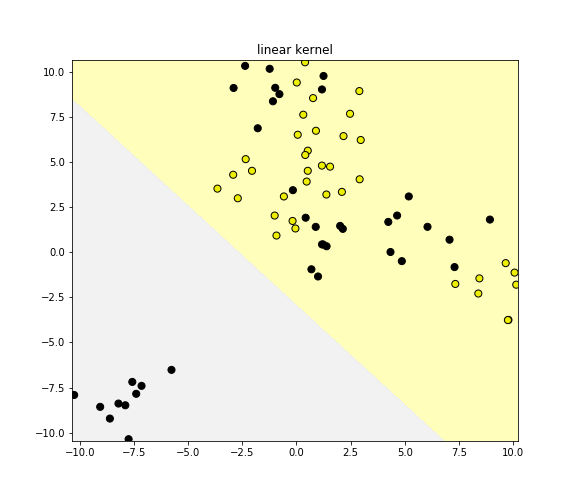

<IPython.core.display.Javascript object>


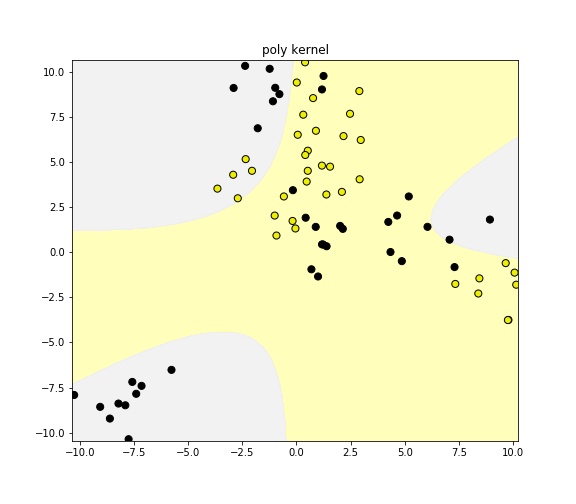

<IPython.core.display.Javascript object>


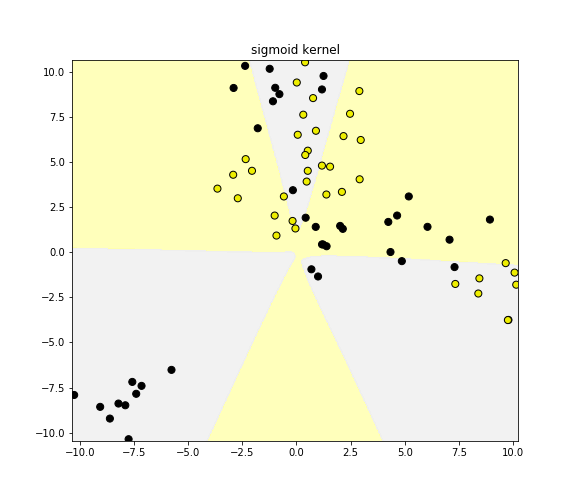

In [169]:
from sklearn.svm import SVC
from adspy_shared_utilities import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)

title = 'Support Vector Classifier: RBF kernel'
plot_class_regions_for_classifier(SVC(kernel='rbf').fit(X_train, y_train),  X_train, y_train, None, None, title)
plot_class_regions_for_classifier(SVC(kernel='linear').fit(X_train, y_train),  X_train, y_train, None, None, 'linear kernel')
plot_class_regions_for_classifier(SVC(kernel='poly').fit(X_train, y_train),  X_train, y_train, None, None, 'poly kernel')
plot_class_regions_for_classifier(SVC(kernel='sigmoid').fit(X_train, y_train),  X_train, y_train, None, None, 'sigmoid kernel')

### SVC with Polynomial kernel of degrees ranging from 1-5

<IPython.core.display.Javascript object>


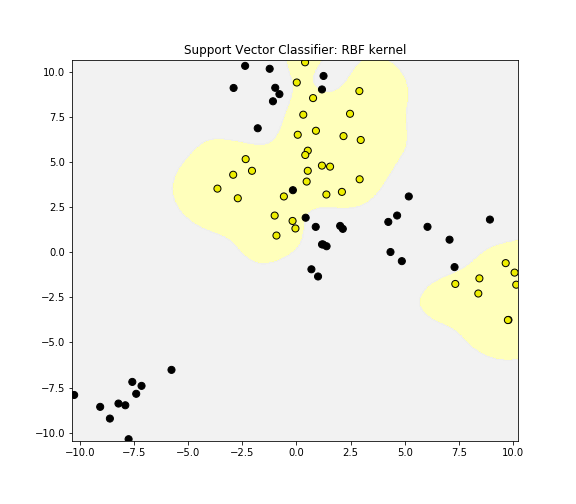

<IPython.core.display.Javascript object>


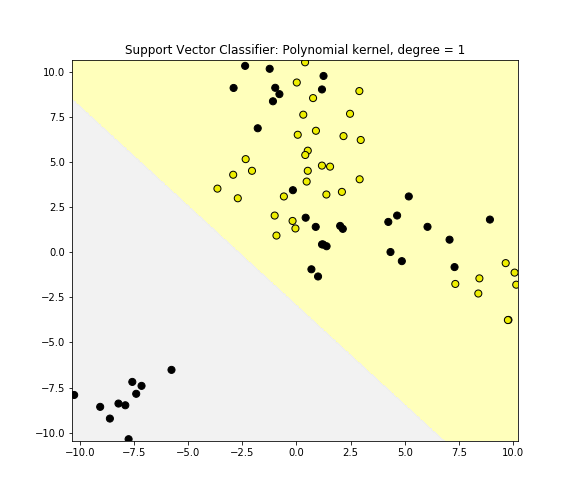

<IPython.core.display.Javascript object>


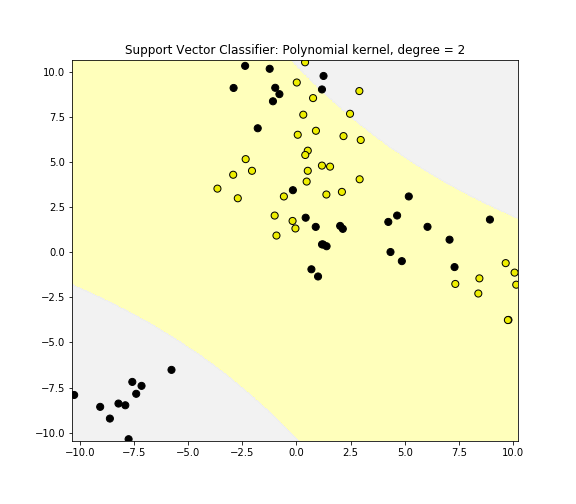

<IPython.core.display.Javascript object>


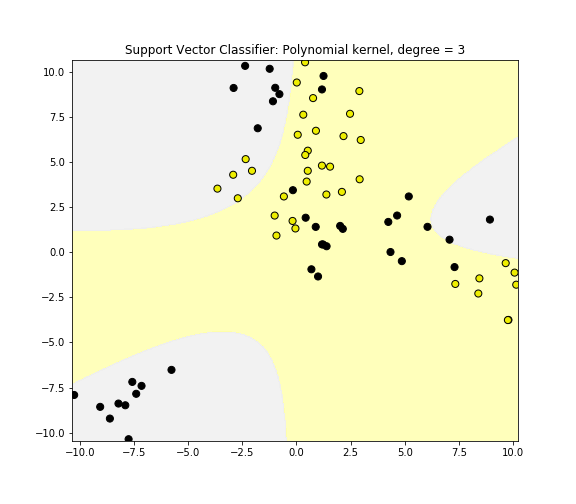

<IPython.core.display.Javascript object>


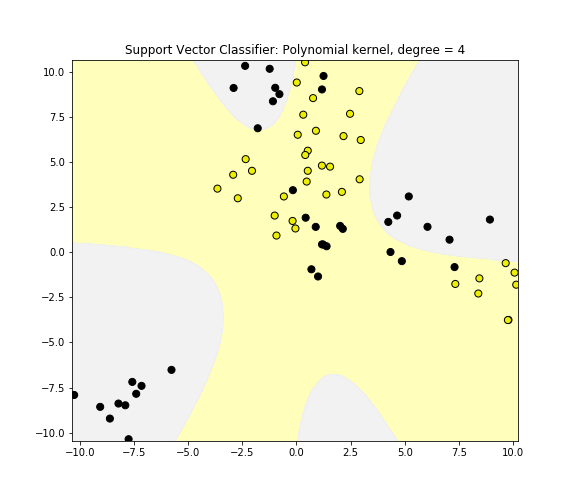

<IPython.core.display.Javascript object>


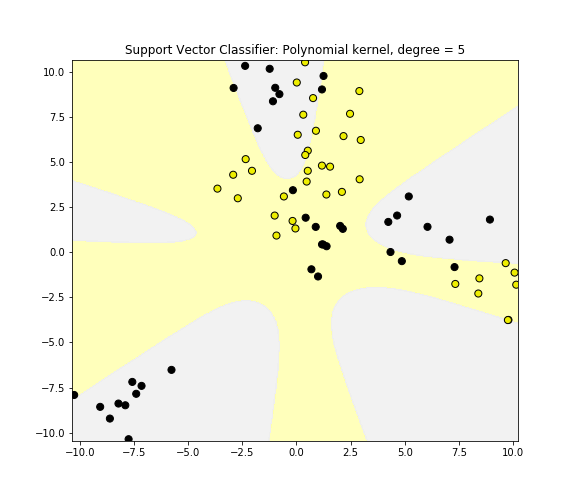

In [170]:
from sklearn.svm import SVC
from adspy_shared_utilities import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)

# The default SVC kernel is radial basis function (RBF)
plot_class_regions_for_classifier(SVC().fit(X_train, y_train),
                                 X_train, y_train, None, None,
                                 'Support Vector Classifier: RBF kernel')

# Compare decision boundries with polynomial kernel, degree = 3
for i in [1,2,3,4,5]:
    title = 'Support Vector Classifier: Polynomial kernel, degree = {}'.format(i)
    plot_class_regions_for_classifier(SVC(kernel = 'poly', degree = i).fit(X_train, y_train), X_train,y_train, None, None,title)

### Support Vector Machine with an RBF Kernel : Gamma Parameter
<b> Gamma paramter defines how far the influence of a single training example reaches <br />
For low values (0.01) reach --> far (see graph)<br />
For high values (10) reach --> close (see graph)
</b>

<IPython.core.display.Javascript object>


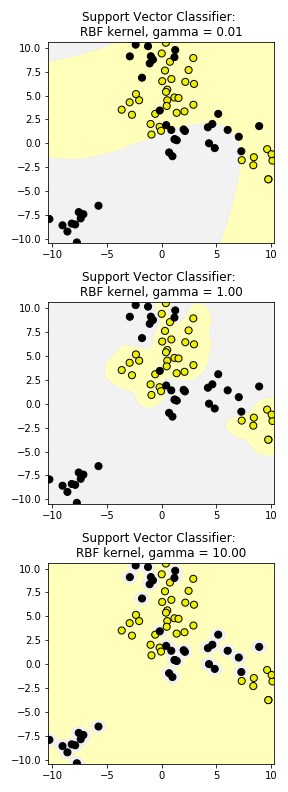

In [171]:
from adspy_shared_utilities import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)
fig, subaxes = plt.subplots(3, 1, figsize=(4, 11))

for this_gamma, subplot in zip([0.01, 1.0, 10.0], subaxes):
    clf = SVC(kernel = 'rbf', gamma=this_gamma).fit(X_train, y_train)
    title = 'Support Vector Classifier: \nRBF kernel, gamma = {:.2f}'.format(this_gamma)
    plot_class_regions_for_classifier_subplot(clf, X_train, y_train,None, None, title, subplot)
    plt.tight_layout()

#### Support Vector Machine with RBF Kernel : using both C and agamma parameter
https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html
<br /><div>
  The C parameter trades off correct classification of training examples against maximization of the decision function’s margin. <br />For larger values of C, a smaller margin will be accepted if the decision function is better at classifying all training points correctly. <br />A lower C will encourage a larger margin, therefore a simpler decision function, at the cost of training accuracy. In other words``C`` behaves as a regularization parameter in the SVM. 
</div>

<IPython.core.display.Javascript object>


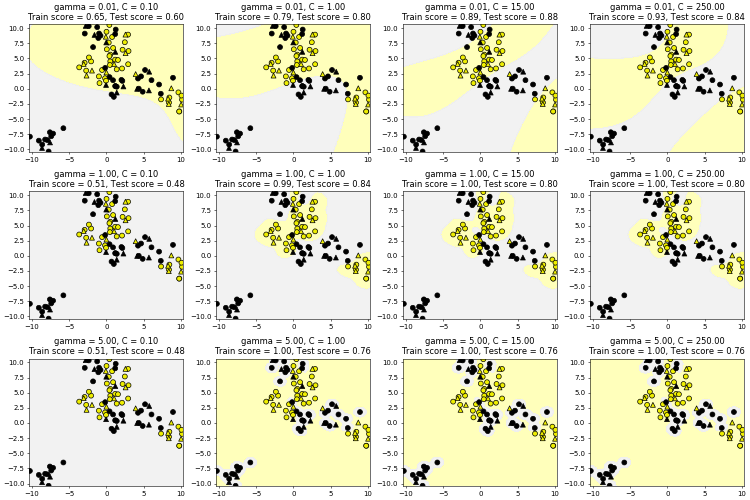

In [172]:
from sklearn.svm import SVC
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)
fig, subaxes = plt.subplots(3, 4, figsize=(15, 10), dpi=50)

for this_gamma, this_axis in zip([0.01, 1, 5], subaxes):
    for this_C, subplot in zip([0.1, 1, 15, 250], this_axis):
        
        title = 'gamma = {:.2f}, C = {:.2f}'.format(this_gamma, this_C)
        
        clf = SVC(kernel = 'rbf', gamma = this_gamma,C = this_C).fit(X_train, y_train)
        
        plot_class_regions_for_classifier_subplot(clf, X_train, y_train,X_test, y_test, title,subplot)
        
        plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)

### Application of SVMs to a real dataset: unnormalized data

In [173]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer,random_state = 0)

clf = SVC(C=10).fit(X_train, y_train)
print('Breast cancer dataset (unnormalized features)')
print('Accuracy of RBF-kernel SVC on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of RBF-kernel SVC on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Breast cancer dataset (unnormalized features)
Accuracy of RBF-kernel SVC on training set: 1.00
Accuracy of RBF-kernel SVC on test set: 0.63


### Application of SVMs to a real dataset: normalized data with feature preprocessing using minmax scaling

In [174]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

clf = SVC(C=10).fit(X_train_scaled, y_train)
print('Breast cancer dataset (normalized with MinMax scaling)')
print('RBF-kernel SVC (with MinMax scaling) training set accuracy: {:.2f}'.format(clf.score(X_train_scaled, y_train)))
print('RBF-kernel SVC (with MinMax scaling) test set accuracy: {:.2f}'.format(clf.score(X_test_scaled, y_test)))

Breast cancer dataset (normalized with MinMax scaling)
RBF-kernel SVC (with MinMax scaling) training set accuracy: 0.98
RBF-kernel SVC (with MinMax scaling) test set accuracy: 0.96


## Cross-validation

### Example based on k-NN classifer with fruit dataset (2 features )

In [175]:
from sklearn.model_selection import cross_val_score

clf = KNeighborsClassifier(n_neighbors=5)
X = X_fruits_2d.as_matrix()
y = y_fruits_2d.as_matrix()
cv_scores = cross_val_score(clf, X, y)

print('Cross-validation scores (3-fold):', cv_scores)
print('Mean cross-validation score (3-fold): {:.3f}'.format(np.mean(cv_scores)))

Cross-validation scores (3-fold): [0.77 0.74 0.83]
Mean cross-validation score (3-fold): 0.781


C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.
C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """


## A note on performing cross-validation for more advanced scenarios.

In some cases (e.g. when feature values have very different ranges), we've seen the need to scale or normalize the training and test sets before use with a classifier. The proper way to do cross-validation when you need to scale the data is *not* to scale the entire dataset with a single transform, since this will indirectly leak information into the training data about the whole dataset, including the test data (see the lecture on data leakage later in the course).  Instead, scaling/normalizing must be computed and applied for each cross-validation fold separately.  To do this, the easiest way in scikit-learn is to use *pipelines*.  While these are beyond the scope of this course, further information is available in the scikit-learn documentation here:

http://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html

or the Pipeline section in the recommended textbook: Introduction to Machine Learning with Python by Andreas C. Müller and Sarah Guido (O'Reilly Media).

## Validation Curve example

In [196]:
from sklearn.svm import SVC
from sklearn.model_selection import validation_curve

param_range = np.logspace(-3,3,4)  # Simply put [0.001,0.1,10,1000]
train_scores, test_scores = validation_curve(estimator=SVC(), X=X,y=y, param_name='gamma', param_range=param_range, cv=3)

print(train_scores)
print(test_scores)

[[0.49 0.42 0.41]
 [0.84 0.72 0.76]
 [0.92 0.9  0.93]
 [1.   1.   0.98]]
[[0.45 0.32 0.33]
 [0.82 0.68 0.61]
 [0.41 0.84 0.67]
 [0.36 0.21 0.39]]


In [190]:
for i in [0,1,2,3]:
    print(np.logspace(-3,3,4)[i])

0.001
0.1
10.0
1000.0


### This code based on scikit-learn validation_plot example
###  See:  http://scikit-learn.org/stable/auto_examples/model_selection/plot_validation_curve.html

<IPython.core.display.Javascript object>


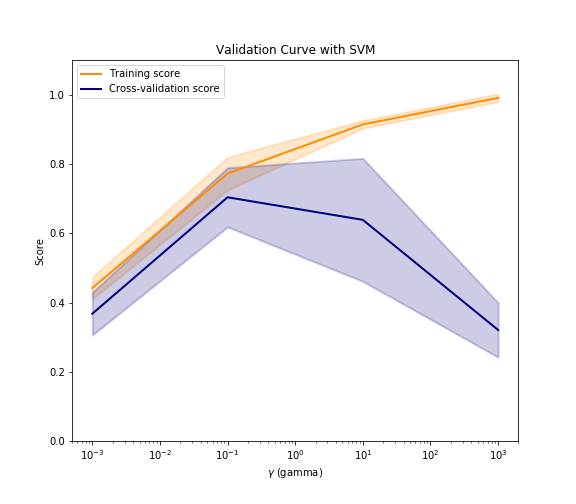

In [197]:
plt.figure()

train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title('Validation Curve with SVM')
plt.xlabel('$\gamma$ (gamma)')
plt.ylabel('Score')
plt.ylim(0.0, 1.1)
lw = 2

plt.semilogx(param_range, train_scores_mean, label='Training score', color='darkorange', lw=lw)

plt.fill_between(param_range, train_scores_mean - train_scores_std,train_scores_mean + train_scores_std, alpha=0.2,color='darkorange', lw=lw)

plt.semilogx(param_range, test_scores_mean, label='Cross-validation score',color='navy', lw=lw)

plt.fill_between(param_range, test_scores_mean - test_scores_std,test_scores_mean + test_scores_std, alpha=0.2,color='navy', lw=lw)

plt.legend(loc='best')
plt.show()

## Decision Trees

In [199]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from adspy_shared_utilities import plot_decision_tree

iris = load_iris()

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, random_state = 3)
clf = DecisionTreeClassifier().fit(X_train, y_train)

print('Accuracy of Decision Tree classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 1.00
Accuracy of Decision Tree classifier on test set: 0.95


#### Setting max decision tree depth to help avoid overfitting

In [200]:
clf2 = DecisionTreeClassifier(max_depth=3).fit(X_train, y_train)
print('Accuracy of Decision Tree classifier on training set: {:.2f}'.format(clf2.score(X_train, y_train)))
print('Accuracy of Decision Tree classifier on test set: {:.2f}'.format(clf2.score(X_test, y_test)))

Accuracy of Decision Tree classifier on training set: 0.98
Accuracy of Decision Tree classifier on test set: 0.97


#### Visualizing decision trees

In [207]:
#plot_decision_tree(clf, iris.feature_names, iris.target_names)

#### Pre-pruned version (max_depth = 3)

In [208]:
#plot_decision_tree(clf2, iris.feature_names, iris.target_names)

#### Feature Importance

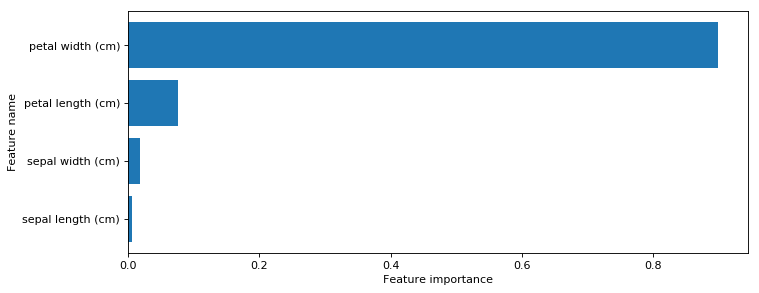

Feature importances: [0.01 0.02 0.08 0.9 ]


In [209]:
from adspy_shared_utilities import plot_feature_importances

plt.figure(figsize=(10,4), dpi=80)
plot_feature_importances(clf, iris.feature_names)
plt.show()

print('Feature importances: {}'.format(clf.feature_importances_))

In [218]:
from sklearn.tree import DecisionTreeClassifier
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot

X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, random_state = 0)
pd.DataFrame(X_train, columns=['sl','sw','pl','pw'])

,sl,sw,pl,pw
0,5.9,3.0,4.2,1.5
1,5.8,2.6,4.0,1.2
2,6.8,3.0,5.5,2.1
3,4.7,3.2,1.3,0.2
4,6.9,3.1,5.1,2.3
5,5.0,3.5,1.6,0.6
6,5.4,3.7,1.5,0.2
7,5.0,2.0,3.5,1.0
8,6.5,3.0,5.5,1.8
9,6.7,3.3,5.7,2.5


In [216]:
pd.DataFrame(y_train)

,0
0,1
1,1
2,2
3,0
4,2
5,0
6,0
7,1
8,2
9,2


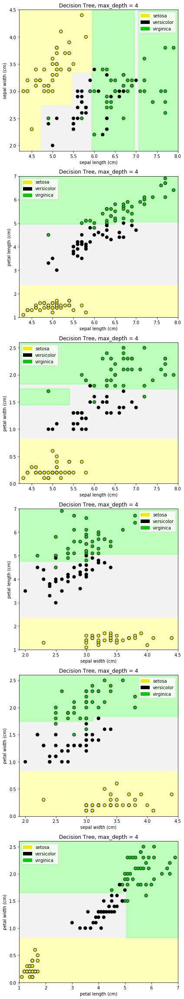

In [219]:
fig, subaxes = plt.subplots(6, 1, figsize=(6, 32))

pair_list = [[0,1], [0,2], [0,3], [1,2], [1,3], [2,3]]
tree_max_depth = 4

for pair, axis in zip(pair_list, subaxes):
    X = X_train[:, pair]
    y = y_train
    
    clf = DecisionTreeClassifier(max_depth=tree_max_depth).fit(X,y)
    title = 'Decision Tree, max_depth = {:d}'.format(tree_max_depth)
    plot_class_regions_for_classifier_subplot(clf, X, y, None,None, title, axis,iris.target_names)
    
    axis.set_xlabel(iris.feature_names[pair[0]])
    axis.set_ylabel(iris.feature_names[pair[1]])
    
plt.tight_layout()
plt.show()

#### Decision Trees on a real-world dataset (Breast Cancer Dataset)

In [221]:
from sklearn.tree import DecisionTreeClassifier
from adspy_shared_utilities import plot_decision_tree
from adspy_shared_utilities import plot_feature_importances

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = DecisionTreeClassifier(max_depth = 4, min_samples_leaf = 8, random_state = 0).fit(X_train, y_train)

#plot_decision_tree(clf, cancer.feature_names, cancer.target_names)

Breast cancer dataset: decision tree
Accuracy of DT classifier on training set: 0.96
Accuracy of DT classifier on test set: 0.94


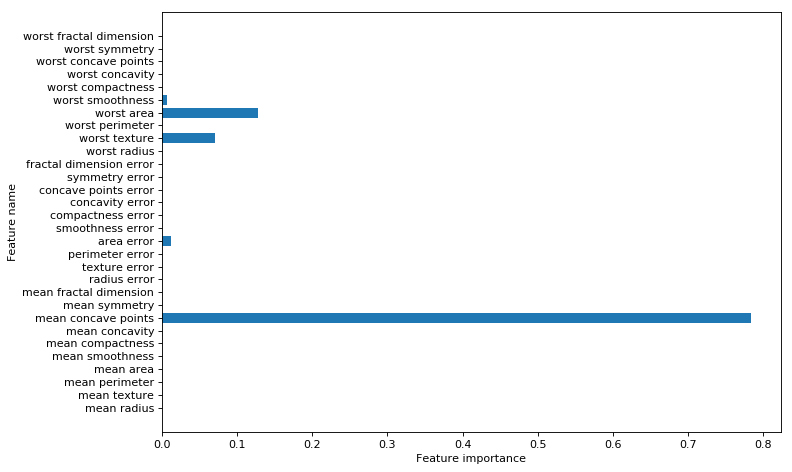

In [222]:
print('Breast cancer dataset: decision tree')
print('Accuracy of DT classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of DT classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

plt.figure(figsize=(10,6),dpi=80)
plot_feature_importances(clf, cancer.feature_names)
plt.tight_layout()
plt.show()

Breast cancer dataset: decision tree
Accuracy of DT classifier on training set: 1.00
Accuracy of DT classifier on test set: 0.88


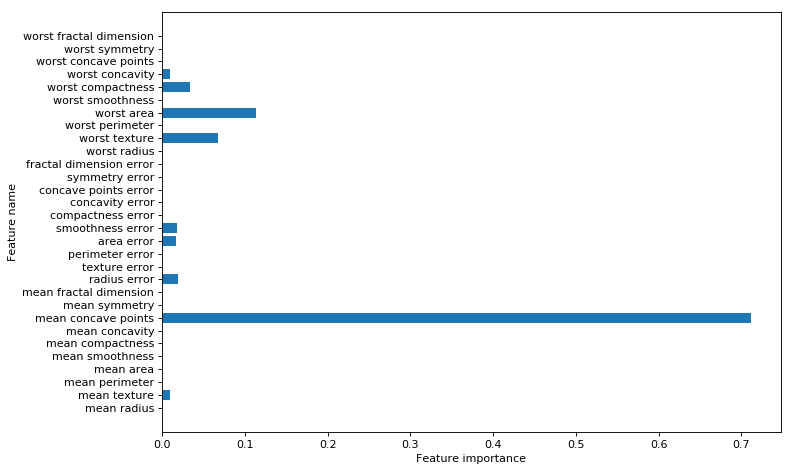

In [223]:
from sklearn.tree import DecisionTreeClassifier
from adspy_shared_utilities import plot_decision_tree
from adspy_shared_utilities import plot_feature_importances

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = DecisionTreeClassifier(random_state = 0).fit(X_train, y_train)

#plot_decision_tree(clf, cancer.feature_names, cancer.target_names)

print('Breast cancer dataset: decision tree')
print('Accuracy of DT classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of DT classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

plt.figure(figsize=(10,6),dpi=80)
plot_feature_importances(clf, cancer.feature_names)
plt.tight_layout()
plt.show()

-----------------------------------------------

## Naive Bayes Classifiers

<IPython.core.display.Javascript object>


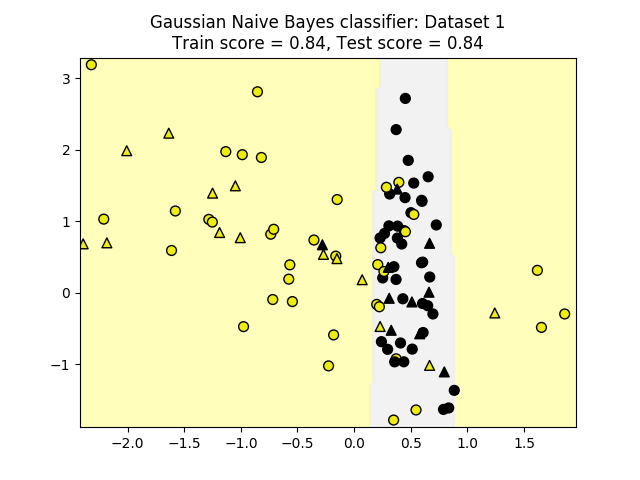

In [204]:
from sklearn.naive_bayes import GaussianNB
from adspy_shared_utilities import plot_class_regions_for_classifier

X_train, X_test, y_train, y_test = train_test_split(X_C2, y_C2, random_state=0)
nbclf = GaussianNB().fit(X_train, y_train)

plot_class_regions_for_classifier(nbclf, X_train, y_train, X_test, y_test, 'Gaussian Naive Bayes classifier: Dataset 1')

<IPython.core.display.Javascript object>


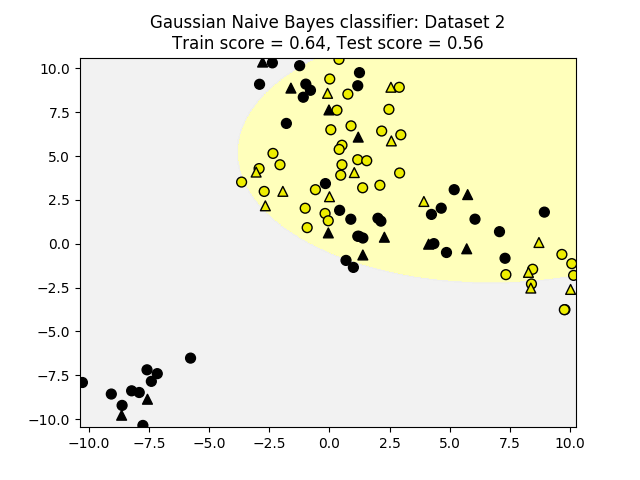

In [205]:
X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)
nbclf = GaussianNB().fit(X_train, y_train)

plot_class_regions_for_classifier(nbclf, X_train, y_train, X_test, y_test, 'Gaussian Naive Bayes classifier: Dataset 2')

### Application to real world dataset

In [206]:
X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

nbclf = GaussianNB().fit(X_train, y_train)

print('Breast cancer dataset')
print('Accuracy of GaussianNB classifier on training set: {:.2f}'.format(nbclf.score(X_train, y_train)))
print('Accuracy of GaussianNB classifier on test set: {:.2f}'.format(nbclf.score(X_test, y_test)))

Breast cancer dataset
Accuracy of GaussianNB classifier on training set: 0.95
Accuracy of GaussianNB classifier on test set: 0.94


## Ensembles of Decision Trees

### Random Forests

<IPython.core.display.Javascript object>


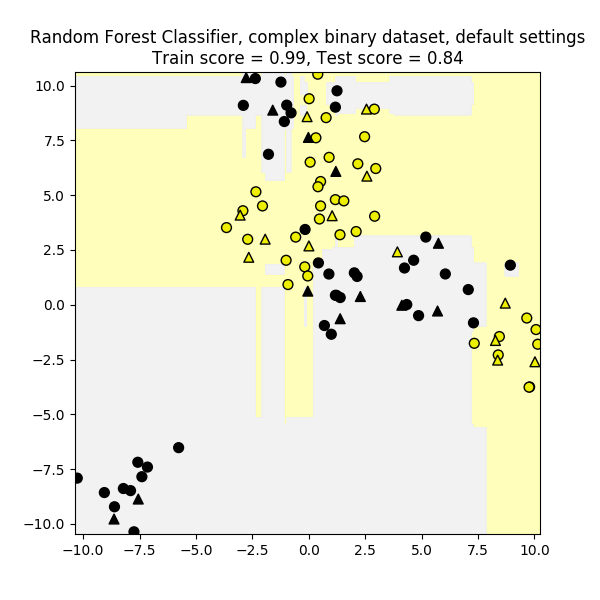

In [211]:
from sklearn.ensemble import RandomForestClassifier
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

clf = RandomForestClassifier().fit(X_train, y_train)
fig, subaxes = plt.subplots(1, 1, figsize=(6, 6))
title = 'Random Forest Classifier, complex binary dataset, default settings'
plot_class_regions_for_classifier_subplot(clf, X_train, y_train, X_test, y_test, title, subaxes)
plt.show()

### Random forest: Fruit dataset

<IPython.core.display.Javascript object>


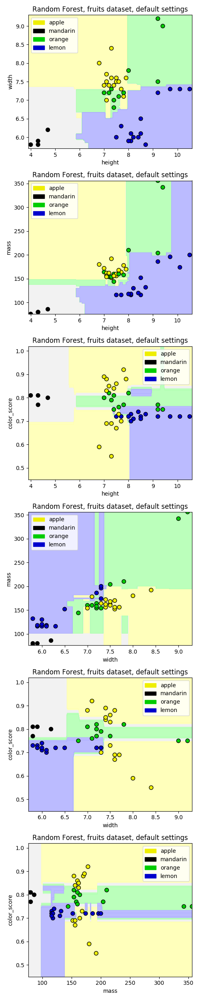

In [215]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot

X_train, X_test, y_train, y_test = train_test_split(X_fruits.as_matrix(),y_fruits.as_matrix(),random_state = 0)

fig, subaxes = plt.subplots(6, 1, figsize=(5, 25))
title = 'Random Forest, fruits dataset, default settings'
pair_list = [[0,1], [0,2], [0,3], [1,2], [1,3], [2,3]]

for pair, axis in zip(pair_list, subaxes):
    X = X_train[:, pair]
    y = y_train
    
    clf = RandomForestClassifier().fit(X, y)
    plot_class_regions_for_classifier_subplot(clf, X, y, None,None, title, axis,target_names_fruits)
    
    axis.set_xlabel(feature_names_fruits[pair[0]])
    axis.set_ylabel(feature_names_fruits[pair[1]])
    
plt.tight_layout()
plt.show()

In [217]:
clf = RandomForestClassifier(n_estimators = 10,random_state=0).fit(X_train, y_train)

print('Random Forest, Fruit dataset, default settings\n')
print('Accuracy of RF classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of RF classifier on test set    : {:.2f}'.format(clf.score(X_test, y_test)))

Random Forest, Fruit dataset, default settings

Accuracy of RF classifier on training set: 1.00
Accuracy of RF classifier on test set    : 0.80


#### Random Forests on a real-world dataset

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)

clf = RandomForestClassifier(max_features = 8, random_state = 0)
clf.fit(X_train, y_train)

print('Breast cancer dataset')
print('Accuracy of RF classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of RF classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

## Gradient Boosted Decision Trees

<IPython.core.display.Javascript object>


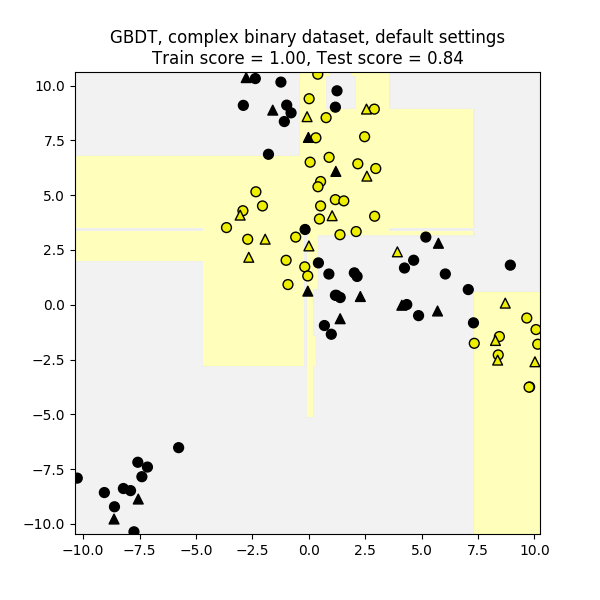

In [218]:
from sklearn.ensemble import GradientBoostingClassifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state = 0)

clf = GradientBoostingClassifier().fit(X_train, y_train)

fig, subaxes = plt.subplots(1, 1, figsize=(6, 6))
title = 'GBDT, complex binary dataset, default settings'
plot_class_regions_for_classifier_subplot(clf, X_train, y_train, X_test,y_test, title, subaxes)
plt.show()

#### Gradient boosted decision trees on the fruit dataset


<IPython.core.display.Javascript object>


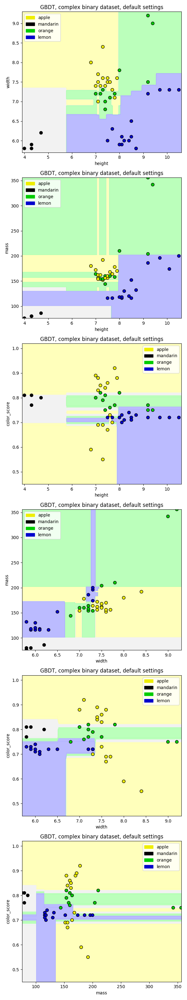

In [219]:
X_train, X_test, y_train, y_test = train_test_split(X_fruits.as_matrix(),y_fruits.as_matrix(),random_state = 0)

fig, subaxes = plt.subplots(6, 1, figsize=(6, 32))
pair_list = [[0,1], [0,2], [0,3], [1,2], [1,3], [2,3]]

for pair, axis in zip(pair_list, subaxes):
    X = X_train[:, pair]
    y = y_train
    
    clf = GradientBoostingClassifier().fit(X, y)
    plot_class_regions_for_classifier_subplot(clf, X, y, None, None, title, axis, target_names_fruits)
    
    axis.set_xlabel(feature_names_fruits[pair[0]])
    axis.set_ylabel(feature_names_fruits[pair[1]])
    
plt.tight_layout()
plt.show()

In [220]:
clf = GradientBoostingClassifier().fit(X_train, y_train)

print('GBDT, Fruit dataset, default settings')
print('Accuracy of GBDT classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of GBDT classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

GBDT, Fruit dataset, default settings
Accuracy of GBDT classifier on training set: 1.00
Accuracy of GBDT classifier on test set: 0.80


#### Gradient-boosted decision trees on a real-world dataset

In [221]:
from sklearn.ensemble import GradientBoostingClassifier

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state=0)

clf = GradientBoostingClassifier(random_state=0)
clf.fit(X_train, y_train)

print('Breast cancer dataset (learning_rate=0.1, max_depth=3)')
print('Accuracy of GBDT classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of GBDT classifier on test set: {:.2f}\n'.format(clf.score(X_test, y_test)))

Breast cancer dataset (learning_rate=0.1, max_depth=3)
Accuracy of GBDT classifier on training set: 1.00
Accuracy of GBDT classifier on test set: 0.96



In [222]:
from sklearn.ensemble import GradientBoostingClassifier

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state=0)

clf = GradientBoostingClassifier(learning_rate=0.1, max_depth=2, random_state=0)
clf.fit(X_train, y_train)

print('Breast cancer dataset (learning_rate=0.01, max_depth=2)')
print('Accuracy of GBDT classifier on training set: {:.2f}'.format(clf.score(X_train, y_train)))
print('Accuracy of GBDT classifier on test set: {:.2f}'.format(clf.score(X_test, y_test)))

Breast cancer dataset (learning_rate=0.01, max_depth=2)
Accuracy of GBDT classifier on training set: 1.00
Accuracy of GBDT classifier on test set: 0.97


## Neural Networks

#### Activation funcitons

<IPython.core.display.Javascript object>


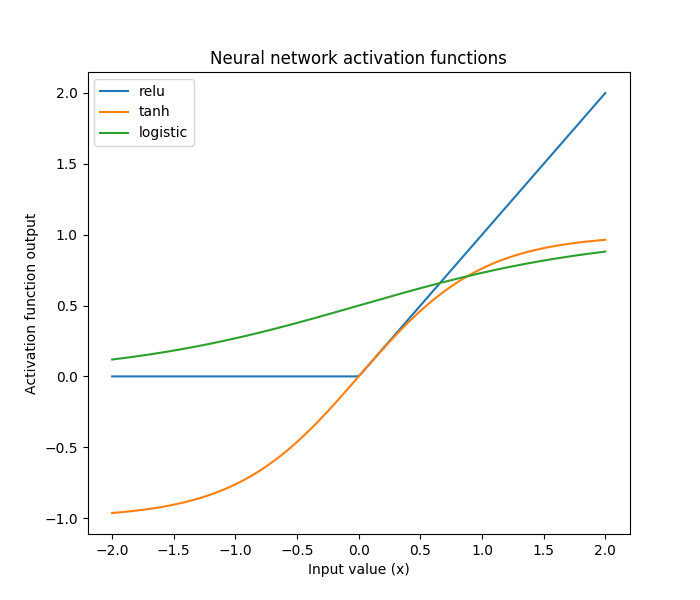

In [227]:
xrange = np.linspace(-2, 2, 200)

plt.figure(figsize=(7,6))
plt.plot(xrange, np.maximum(xrange, 0), label = 'relu')
plt.plot(xrange, np.tanh(xrange), label = 'tanh')
plt.plot(xrange, 1 / (1 + np.exp(-xrange)), label = 'logistic')
plt.legend()
plt.title('Neural network activation functions')
plt.xlabel('Input value (x)')
plt.ylabel('Activation function output')
plt.show()

### Neural Networks : Classification
#### Synthetic dataset 1: single hidden layer

<IPython.core.display.Javascript object>


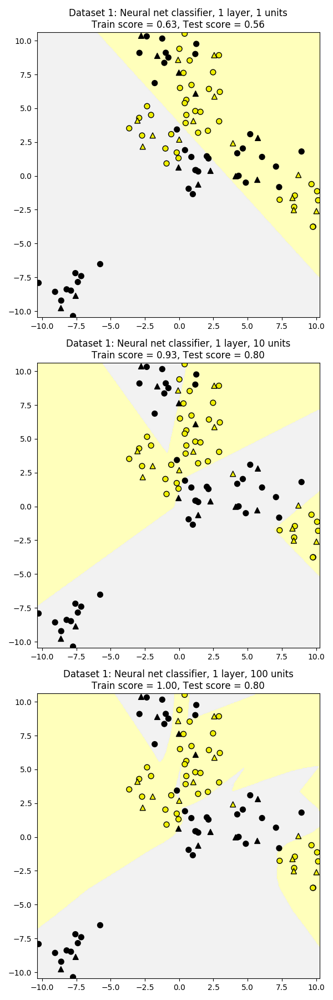

In [230]:
from sklearn.neural_network import MLPClassifier

X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)
fig, subaxes = plt.subplots(3, 1, figsize=(6,18))

for units, axis in zip([1,10,100], subaxes):
    nnclf = MLPClassifier(hidden_layer_sizes= [units], solver='lbfgs', random_state = 0).fit(X_train, y_train)
    
    title = 'Dataset 1: Neural net classifier, 1 layer, {} units'.format(units)
    plot_class_regions_for_classifier_subplot(nnclf, X_train, y_train,X_test, y_test, title, axis)
    plt.tight_layout()

#### Synthetic dataset 1: two hidden layers

<IPython.core.display.Javascript object>


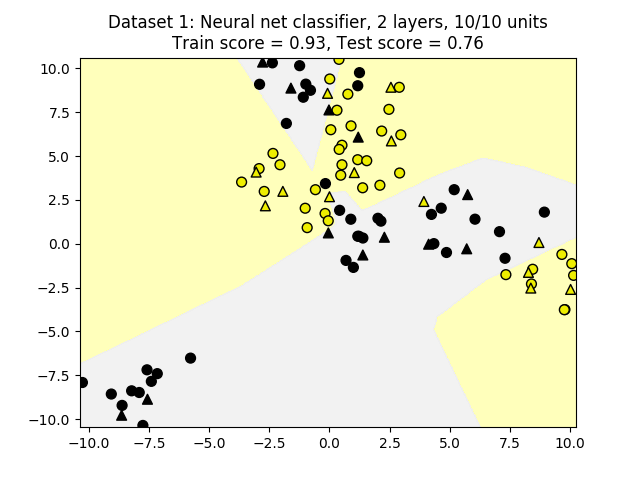

In [232]:
X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

nnclf = MLPClassifier(hidden_layer_sizes = [10, 10], solver='lbfgs',random_state = 0).fit(X_train, y_train)

title = 'Dataset 1: Neural net classifier, 2 layers, 10/10 units'
plot_class_regions_for_classifier(nnclf, X_train, y_train, X_test, y_test,title)

#### Regularization parameter: alpha

<IPython.core.display.Javascript object>


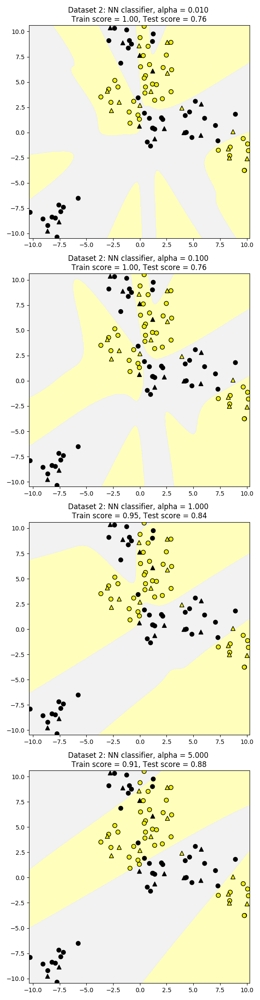

In [233]:
X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

fig, subaxes = plt.subplots(4, 1, figsize=(6, 23))

for this_alpha, axis in zip([0.01, 0.1, 1.0, 5.0], subaxes):
    nnclf = MLPClassifier(solver='lbfgs', activation = 'tanh',alpha = this_alpha,
                         hidden_layer_sizes = [100, 100],random_state = 0).fit(X_train, y_train)
    
    title = 'Dataset 2: NN classifier, alpha = {:.3f} '.format(this_alpha)
    plot_class_regions_for_classifier_subplot(nnclf, X_train, y_train,X_test, y_test, title, axis)
    plt.tight_layout()

#### The effect of different choices of activation function

<IPython.core.display.Javascript object>


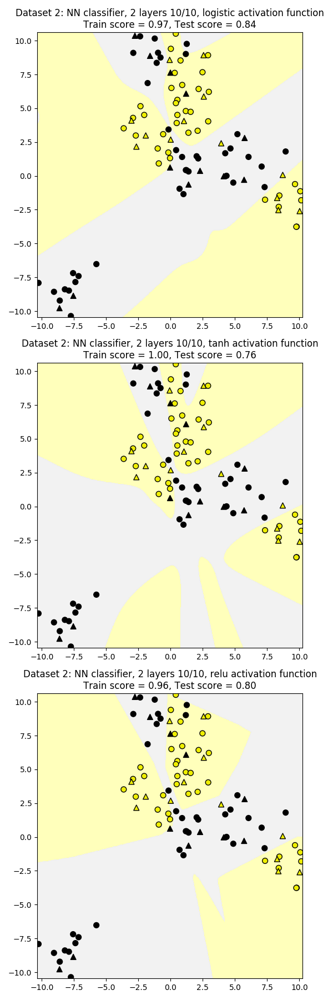

In [234]:
X_train, X_test, y_train, y_test = train_test_split(X_D2, y_D2, random_state=0)

fig, subaxes = plt.subplots(3, 1, figsize=(6,18))

for this_activation, axis in zip(['logistic', 'tanh', 'relu'], subaxes):
    nnclf = MLPClassifier(solver='lbfgs', activation = this_activation, alpha = 0.1, hidden_layer_sizes = [10, 10],
                         random_state = 0).fit(X_train, y_train)
    
    title = 'Dataset 2: NN classifier, 2 layers 10/10, {} activation function'.format(this_activation)
    plot_class_regions_for_classifier_subplot(nnclf, X_train, y_train,X_test, y_test, title, axis)
    plt.tight_layout()

### Neural networks: Regression

<IPython.core.display.Javascript object>


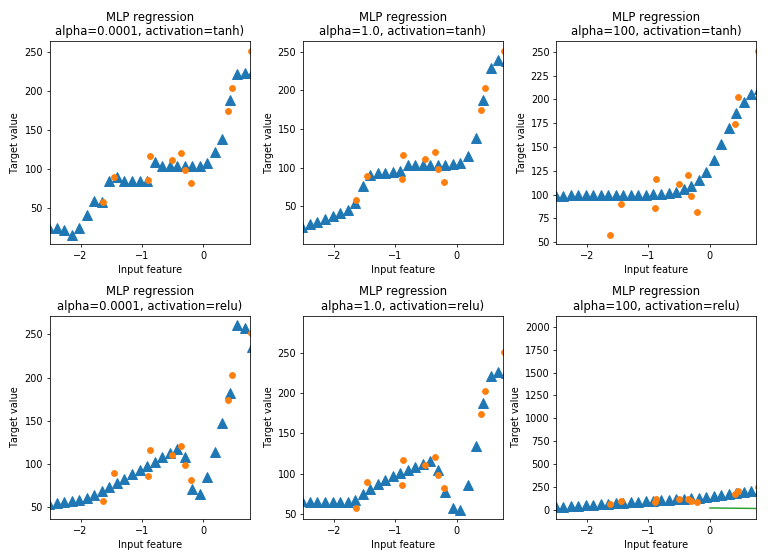

In [235]:
from sklearn.neural_network import MLPRegressor

fig, subaxes = plt.subplots(2, 3, figsize=(11,8), dpi=70)

X_predict_input = np.linspace(-3, 3, 50).reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X_R1[0::5], y_R1[0::5], random_state = 0)

for thisaxisrow, thisactivation in zip(subaxes, ['tanh', 'relu']):
    for thisalpha, thisaxis in zip([0.0001, 1.0, 100], thisaxisrow):
        mlpreg = MLPRegressor(hidden_layer_sizes = [100,100],activation = thisactivation,
                             alpha = thisalpha,solver = 'lbfgs').fit(X_train, y_train)
        
        y_predict_output = mlpreg.predict(X_predict_input)
        
        thisaxis.set_xlim([-2.5, 0.75])
        thisaxis.plot(X_predict_input, y_predict_output,'^', markersize = 10)
        thisaxis.plot(X_train, y_train, 'o')
        thisaxis.set_xlabel('Input feature')
        thisaxis.set_ylabel('Target value')
        thisaxis.set_title('MLP regression\nalpha={}, activation={})'.format(thisalpha, thisactivation))
        plt.tight_layout()

#### Application to real-world dataset for classification

In [236]:
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train, X_test, y_train, y_test = train_test_split(X_cancer, y_cancer, random_state = 0)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

clf = MLPClassifier(hidden_layer_sizes = [100, 100], alpha = 5.0,random_state = 0, solver='lbfgs').fit(X_train_scaled, y_train)

print('Breast cancer dataset')
print('Accuracy of NN classifier on training set: {:.2f}'.format(clf.score(X_train_scaled, y_train)))
print('Accuracy of NN classifier on test set: {:.2f}'.format(clf.score(X_test_scaled, y_test)))

Breast cancer dataset
Accuracy of NN classifier on training set: 0.98
Accuracy of NN classifier on test set: 0.97


In [242]:
import cv2
cv2.imshow('Cancer Image 0', X_train[0])
cv2.waitKey()
cv2.destroyAllWindows()

error: OpenCV(4.0.0) c:\projects\opencv-python\opencv\modules\imgproc\src\color.hpp:261: error: (-2:Unspecified error) in function '__cdecl cv::CvtHelper<struct cv::Set<1,-1,-1>,struct cv::Set<3,4,-1>,struct cv::Set<0,2,5>,2>::CvtHelper(const class cv::_InputArray &,const class cv::_OutputArray &,int)'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)


-----------------------------------------------

# Week 4 to be inserted here 

# Classification Evaluation Metrics

In [2]:
%matplotlib notebook
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_digits

dataset = load_digits()
X, y = dataset.data, dataset.target

for class_name, class_count in zip(dataset.target_names, np.bincount(dataset.target)):
    print(class_name, class_count)

0 178
1 182
2 177
3 183
4 181
5 182
6 181
7 179
8 174
9 180


## Creating a n imbalanced dataset

In [3]:
y_binary_imbalanced = y.copy()
y_binary_imbalanced[y_binary_imbalanced !=1 ] = 0

print('Original labels:\t', y[1:30])
print('New binary labels:\t', y_binary_imbalanced[1:30])

Original labels:	 [1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9]
New binary labels:	 [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]


 ### Negative class (0) is the most frequent class

In [4]:
np.bincount(y_binary_imbalanced)   

array([1615,  182], dtype=int64)

In [5]:
np.unique(y_binary_imbalanced, return_counts=True)

(array([0, 1]), array([1615,  182], dtype=int64))

In [6]:
import scipy
scipy.stats.itemfreq(y_binary_imbalanced)

C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `itemfreq` is deprecated!
`itemfreq` is deprecated and will be removed in a future version. Use instead `np.unique(..., return_counts=True)`
  


array([[   0, 1615],
       [   1,  182]], dtype=int64)

In [10]:
# value_counts
pd.Series(y_binary_imbalanced).value_counts()

0    1615
1     182
dtype: int64

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y_binary_imbalanced, random_state=0)

from sklearn.svm import SVC

model = SVC(kernel='rbf', C=1).fit(X_train, y_train)
model.score(X_test, y_test)

0.9088888888888889

### Dummy Classifiers
DummyClassifier is a classifier that makes predictions using simple rules, which can be useful as a baseline for comparison against actual classifiers, especially with imbalanced classes

In [114]:
from sklearn.dummy import DummyClassifier

model = DummyClassifier(strategy='most_frequent').fit(X_train, y_train)
model.score(X_test, y_test)

0.9044444444444445

In [116]:
model.predict(X_test)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

### Better choice of kernel or hyper-parameters will improve accuracy
### Ineffective, erroneous or missing features, Class Imabalance could affect the accuracy

In [70]:
svm = SVC(kernel='linear', C=1).fit(X_train, y_train)    # Trying linear kernel instead of RBF kernel from before
svm.score(X_test, y_test)

0.9777777777777777

### Confusion matrices

#### Binary (two-class) confusion matrix

In [71]:
from sklearn.metrics import confusion_matrix

model = DummyClassifier(strategy='most_frequent').fit(X_train, y_train)
max_predict = model.predict(X_test)
confusion = confusion_matrix(y_test, max_predict)
confusion

array([[407,   0],
       [ 43,   0]], dtype=int64)

### produces random predictions w/ same class proportion as training set

In [72]:
dummy_classprop = DummyClassifier(strategy='stratified').fit(X_train, y_train)
y_classprop_predicted = dummy_classprop.predict(X_test)
confusion = confusion_matrix(y_test, y_classprop_predicted)

print('Random class-proportional prediction (dummy classifier)\n', confusion)

Random class-proportional prediction (dummy classifier)
 [[368  39]
 [ 39   4]]


C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\dummy.py:227: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  k in range(self.n_outputs_)).T


In [74]:
svm = SVC(kernel='linear', C=1).fit(X_train, y_train)
svm_predicted = svm.predict(X_test)
confusion = confusion_matrix(y_test, svm_predicted)
print('Support vector machine classifier (linear kernel, C=1)\n', confusion)

Support vector machine classifier (linear kernel, C=1)
 [[402   5]
 [  5  38]]


In [75]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression().fit(X_train, y_train)
lr_predicted = lr.predict(X_test)
confusion = confusion_matrix(y_test, lr_predicted)

print('Logistic regression classifier (default settings)\n', confusion)

Logistic regression classifier (default settings)
 [[401   6]
 [  6  37]]


In [79]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier(max_depth=2).fit(X_train, y_train)
tree_predict = model.predict(X_test)
confusion = confusion_matrix(y_test, tree_predict)

print('Decision tree classifier (max_depth = 2)\n', confusion)

Decision tree classifier (max_depth = 2)
 [[400   7]
 [ 17  26]]


## Evaluation metrics for binary classification

### Accuracy = TP + TN / (TP + TN + FP + FN)
### Precision = TP / (TP + FP)
### Recall/TPR  = TP / (TP + FN)  Also known as sensitivity, or True Positive Rate
### F1 Score  = 2 * Precision * Recall / (Precision + Recall) 

In [81]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('Accuracy: {:.2f}'.format(accuracy_score(y_test, tree_predict)))
print('Precision: {:.2f}'.format(precision_score(y_test, tree_predict)))
print('Recall: {:.2f}'.format(recall_score(y_test, tree_predict)))
print('F1: {:.2f}'.format(f1_score(y_test, tree_predict, )))

Accuracy: 0.95
Precision: 0.79
Recall: 0.60
F1: 0.68


## Combined report with all above metrics

In [85]:
from sklearn.metrics import classification_report

print(classification_report(y_test, tree_predict, target_names=['Not 1', '1']))

             precision    recall  f1-score   support

      Not 1       0.96      0.98      0.97       407
          1       0.79      0.60      0.68        43

avg / total       0.94      0.95      0.94       450



In [90]:
print('Random class-proportional (dummy)\n', classification_report(y_test, y_classprop_predicted, target_names=['not 1', '1']))
print('SVM\n', classification_report(y_test, svm_predicted, target_names = ['not 1', '1']))
print('Logistic regression\n', classification_report(y_test, lr_predicted, target_names = ['not 1', '1']))
print('Decision tree\n', classification_report(y_test, tree_predict, target_names = ['not 1', '1']))

Random class-proportional (dummy)
              precision    recall  f1-score   support

      not 1       0.90      0.90      0.90       407
          1       0.09      0.09      0.09        43

avg / total       0.83      0.83      0.83       450

SVM
              precision    recall  f1-score   support

      not 1       0.99      0.99      0.99       407
          1       0.88      0.88      0.88        43

avg / total       0.98      0.98      0.98       450

Logistic regression
              precision    recall  f1-score   support

      not 1       0.99      0.99      0.99       407
          1       0.86      0.86      0.86        43

avg / total       0.97      0.97      0.97       450

Decision tree
              precision    recall  f1-score   support

      not 1       0.96      0.98      0.97       407
          1       0.79      0.60      0.68        43

avg / total       0.94      0.95      0.94       450



## Decision Functions

In [95]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression().fit(X_train, y_train)

X_train, X_test, y_train, y_test = train_test_split(X, y_binary_imbalanced, random_state=0)
y_score_lr = lr.fit(X_train, y_train).decision_function(X_test)
y_score_list = list(zip(y_test[0:20], y_scores_lr[0:20]))

y_score_list

[(0, -23.176547400757663),
 (0, -13.541223742469006),
 (0, -21.72250047336062),
 (0, -18.907578437722535),
 (0, -19.736034587372785),
 (0, -9.749345951179265),
 (1, 5.23490021249531),
 (0, -19.30716117885968),
 (0, -25.101015601857377),
 (0, -21.827250934235906),
 (0, -24.150855663826754),
 (0, -19.576844844946265),
 (0, -22.574902551102674),
 (0, -10.823739601445064),
 (0, -11.912425566043064),
 (0, -10.97956652705531),
 (1, 11.205846086251942),
 (0, -27.645770221552823),
 (0, -12.859636015637092),
 (0, -25.848590145556187)]

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y_binary_imbalanced, random_state=0)
y_proba_lr = lr.fit(X_train, y_train).predict_proba(X_test)
y_proba_list = list(zip(y_test[0:20], y_proba_lr[0:20,1]))

# show the probability of positive class for first 20 instances
y_proba_list

[(0, 8.60108727067405e-11),
 (0, 1.3155903495453823e-06),
 (0, 3.6816111034009875e-10),
 (0, 6.1452989618944584e-09),
 (0, 2.6837934145133596e-09),
 (0, 5.832940124078156e-05),
 (1, 0.9947008742687163),
 (0, 4.1210362715903745e-09),
 (0, 1.2553575357627774e-11),
 (0, 3.3154719959007555e-10),
 (0, 3.246509304835812e-11),
 (0, 3.1469099051059103e-09),
 (0, 1.56980024484208e-10),
 (0, 1.992053353707062e-05),
 (0, 6.706507243234968e-06),
 (0, 1.70461945380572e-05),
 (1, 0.9999864056960567),
 (0, 9.853591296551983e-13),
 (0, 2.600937459498366e-06),
 (0, 5.944289259618554e-12)]

## Precision-recall curves

[0.09555556 0.86046512 1.        ] [1.         0.86046512 0.        ] [0 1]


<IPython.core.display.Javascript object>


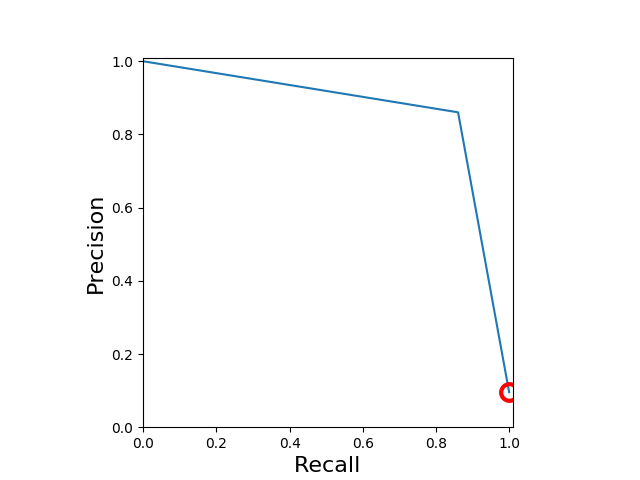

In [104]:
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, lr_predicted)
print(precision, recall, thresholds )
closest_zero = np.argmin(np.abs(thresholds))
closest_zero_p = precision[closest_zero]
closest_zero_r = recall[closest_zero]

plt.figure()
plt.xlim([0.0, 1.01])
plt.ylim([0.0, 1.01])
plt.plot(recall, precision, label='Precision-recall curve')
plt.plot(closest_zero_r, closest_zero_p, 'o', markersize = 12, fillstyle='none', c='r', mew = 3)
plt.ylabel('Precision', fontsize = 16)
plt.xlabel('Recall', fontsize = 16)
plt.axes().set_aspect('equal')
plt.show()

### ROC curves, Area-Under-Curve (AUC)

In [105]:
from sklearn.metrics import roc_curve, auc

X_train, X_test, y_train, y_test = train_test_split(X, y_binary_imbalanced, random_state=0)

y_score_lr = lr.fit(X_train, y_train).decision_function(X_test)
fpr_lr, tpr_lr, _ = roc_curve(y_test, y_score_lr)
roc_auc_lr = auc(fpr_lr, tpr_lr)

In [106]:
roc_curve(y_test, y_score_lr)

(array([0.        , 0.        , 0.002457  , 0.002457  , 0.00737101,
        0.00737101, 0.01228501, 0.01228501, 0.01474201, 0.01474201,
        0.01965602, 0.01965602, 0.02457002, 0.02457002, 0.02702703,
        0.02702703, 0.02948403, 0.02948403, 0.04914005, 0.04914005,
        1.        ]),
 array([0.02325581, 0.23255814, 0.23255814, 0.34883721, 0.34883721,
        0.74418605, 0.74418605, 0.79069767, 0.79069767, 0.86046512,
        0.86046512, 0.90697674, 0.90697674, 0.93023256, 0.93023256,
        0.95348837, 0.95348837, 0.97674419, 0.97674419, 1.        ,
        1.        ]),
 array([ 16.02850745,   9.84746047,   8.45767939,   7.21929417,
          6.87013568,   1.87960146,   1.68346682,   1.00485768,
          0.63948636,   0.13091544,  -1.08163943,  -1.3402485 ,
         -1.685346  ,  -1.72765067,  -1.75285726,  -1.87206111,
         -2.03762593,  -2.15851971,  -3.93693091,  -4.04845925,
        -43.20743679]))

In [109]:
roc_auc_lr

0.9912576424204331

<IPython.core.display.Javascript object>


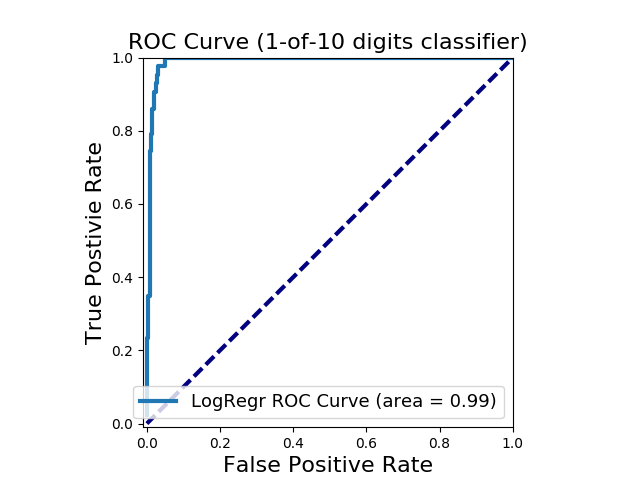

In [112]:
plt.figure()
plt.xlim([-.01,1.00])
plt.ylim([-.01, 1.00])
plt.plot(fpr_lr, tpr_lr, lw=3, label='LogRegr ROC Curve (area = {:0.2f})'.format(roc_auc_lr))
plt.xlabel('False Positive Rate', fontsize = 16)
plt.ylabel('True Postivie Rate', fontsize = 16)
plt.legend(loc='lower right', fontsize = 13)
plt.title('ROC Curve (1-of-10 digits classifier)', fontsize = 16)
plt.plot([0, 1], [0, 1], color='navy', lw=3, linestyle='--')
plt.axes().set_aspect('equal')
plt.show()

<IPython.core.display.Javascript object>


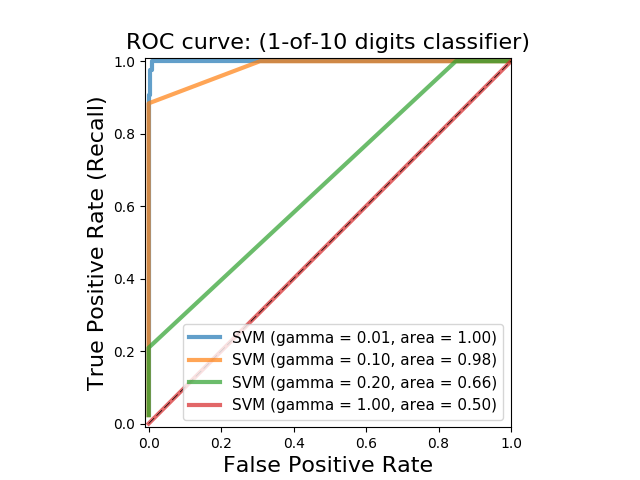

gamma = 0.01  accuracy = 0.91   AUC = 1.00
gamma = 0.10  accuracy = 0.90   AUC = 0.98
gamma = 0.20  accuracy = 0.90   AUC = 0.66
gamma = 1.00  accuracy = 0.90   AUC = 0.50


In [113]:
from matplotlib import cm

X_train, X_test, y_train, y_test = train_test_split(X, y_binary_imbalanced, random_state=0)

plt.figure()
plt.xlim([-0.01, 1.00])
plt.ylim([-0.01, 1.01])
for g in [0.01, 0.1, 0.20, 1]:
    svm = SVC(gamma=g).fit(X_train, y_train)
    y_score_svm = svm.decision_function(X_test)
    fpr_svm, tpr_svm, _ = roc_curve(y_test, y_score_svm)
    roc_auc_svm = auc(fpr_svm, tpr_svm)
    accuracy_svm = svm.score(X_test, y_test)
    print("gamma = {:.2f}  accuracy = {:.2f}   AUC = {:.2f}".format(g, accuracy_svm, roc_auc_svm))
    plt.plot(fpr_svm, tpr_svm, lw=3, alpha=0.7, label='SVM (gamma = {:0.2f}, area = {:0.2f})'.format(g, roc_auc_svm))

plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate (Recall)', fontsize=16)
plt.plot([0, 1], [0, 1], color='k', lw=0.5, linestyle='--')
plt.legend(loc="lower right", fontsize=11)
plt.title('ROC curve: (1-of-10 digits classifier)', fontsize=16)
plt.axes().set_aspect('equal')
plt.show()

## Evaluation Metrics for multi-class classification

### Multi-class Confusion Matrix

In [126]:
dataset = load_digits()
X, y = dataset.data, dataset.target
X_train_mc, X_test_mc, y_train_mc, y_test_mc = train_test_split(X, y, random_state=0)

print(X.shape, y.shape)
for class_name, class_count in zip(dataset.target_names, np.bincount(dataset.target)):
    print(class_name, class_count)

(1797, 64) (1797,)
0 178
1 182
2 177
3 183
4 181
5 182
6 181
7 179
8 174
9 180


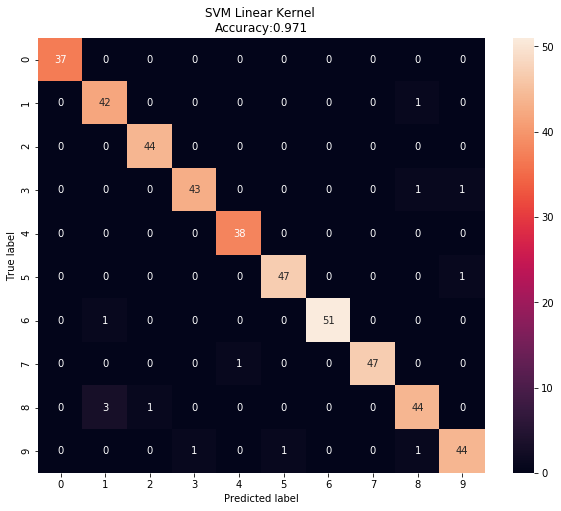

In [122]:
svm = SVC(kernel = 'linear').fit(X_train_mc, y_train_mc)
svm_predicted_mc = svm.predict(X_test_mc)
confusion_mc = confusion_matrix(y_test_mc, svm_predicted_mc)
df_cm = pd.DataFrame(confusion_mc, index = [i for i in range(0,10)], columns = [i for i in range(0,10)])

plt.figure(figsize=(10,8))
sns.heatmap(df_cm, annot=True)
plt.title('SVM Linear Kernel \nAccuracy:{0:.3f}'.format(accuracy_score(y_test_mc, svm_predicted_mc)))
plt.ylabel('True label')
plt.xlabel('Predicted label')

In [123]:
df_cm

,0,1,2,3,4,5,6,7,8,9
0,37,0,0,0,0,0,0,0,0,0
1,0,42,0,0,0,0,0,0,1,0
2,0,0,44,0,0,0,0,0,0,0
3,0,0,0,43,0,0,0,0,1,1
4,0,0,0,0,38,0,0,0,0,0
5,0,0,0,0,0,47,0,0,0,1
6,0,1,0,0,0,0,51,0,0,0
7,0,0,0,0,1,0,0,47,0,0
8,0,3,1,0,0,0,0,0,44,0
9,0,0,0,1,0,1,0,0,1,44


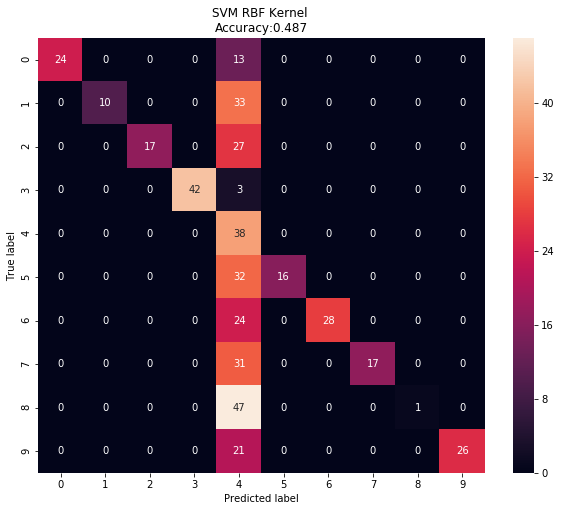

In [124]:
svm = SVC(kernel = 'rbf').fit(X_train_mc, y_train_mc)
svm_predicted_mc = svm.predict(X_test_mc)
confusion_mc = confusion_matrix(y_test_mc, svm_predicted_mc)
df_cm = pd.DataFrame(confusion_mc, index = [i for i in range(0,10)], columns = [i for i in range(0,10)])

plt.figure(figsize = (10,8))
sns.heatmap(df_cm, annot=True)
plt.title('SVM RBF Kernel \nAccuracy:{0:.3f}'.format(accuracy_score(y_test_mc, svm_predicted_mc)))
plt.ylabel('True label')
plt.xlabel('Predicted label');

In [127]:
df_cm

,0,1,2,3,4,5,6,7,8,9
0,24,0,0,0,13,0,0,0,0,0
1,0,10,0,0,33,0,0,0,0,0
2,0,0,17,0,27,0,0,0,0,0
3,0,0,0,42,3,0,0,0,0,0
4,0,0,0,0,38,0,0,0,0,0
5,0,0,0,0,32,16,0,0,0,0
6,0,0,0,0,24,0,28,0,0,0
7,0,0,0,0,31,0,0,17,0,0
8,0,0,0,0,47,0,0,0,1,0
9,0,0,0,0,21,0,0,0,0,26


#### Multi-class classification report


In [128]:
print(classification_report(y_test_mc, svm_predicted_mc))

             precision    recall  f1-score   support

          0       1.00      0.65      0.79        37
          1       1.00      0.23      0.38        43
          2       1.00      0.39      0.56        44
          3       1.00      0.93      0.97        45
          4       0.14      1.00      0.25        38
          5       1.00      0.33      0.50        48
          6       1.00      0.54      0.70        52
          7       1.00      0.35      0.52        48
          8       1.00      0.02      0.04        48
          9       1.00      0.55      0.71        47

avg / total       0.93      0.49      0.54       450



#### Micro - vs. Macro average metrics 

In [130]:
print('Micro-averaged precision = {:.2f} (treat instances equally)'
      .format(precision_score(y_test_mc, svm_predicted_mc, average='micro')))
print('Macro-averaged precision = {:.2f} (treat classes equally)'
      .format(precision_score(y_test_mc, svm_predicted_mc, average='macro')))

Micro-averaged precision = 0.49 (treat instances equally)
Macro-averaged precision = 0.91 (treat classes equally)


In [131]:
print('Micro-averaged f1 = {:.2f} (treat instances equally)'
      .format(f1_score(y_test_mc, svm_predicted_mc, average = 'micro')))
print('Macro-averaged f1 = {:.2f} (treat classes equally)'
      .format(f1_score(y_test_mc, svm_predicted_mc, average = 'macro')))

Micro-averaged f1 = 0.49 (treat instances equally)
Macro-averaged f1 = 0.54 (treat classes equally)


# Regression Evaluation Metrics

In [151]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.dummy import DummyRegressor

diabetes = datasets.load_diabetes()

X = diabetes.data[:, None, 6]
y = diabetes.target

In [168]:
y2 = np.reshape(y, (442,1))
#print(X, y2)
pd.Series({'X':X, 'y':y})

X    [[-0.0434008456520269], [0.0744115640787594], ...
y    [151.0, 75.0, 141.0, 206.0, 135.0, 97.0, 138.0...
dtype: object

In [170]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

lm = LinearRegression().fit(X_train, y_train)
lm_dummy_mean = DummyRegressor(strategy = 'mean').fit(X_train, y_train)

y_predict = lm.predict(X_test)
y_predict_dummy_mean = lm_dummy_mean.predict(X_test)

print('Linear model, coefficients       : ', lm.coef_)

print("Mean squared error (dummy)       : {:.2f}".format(mean_squared_error(y_test, y_predict_dummy_mean)))
print("Mean squared error (linear model): {:.2f}".format(mean_squared_error(y_test, y_predict)))

print("r2_score (dummy)                 : {:.2f}".format(r2_score(y_test, y_predict_dummy_mean)))
print("r2_score (linear model)          : {:.2f}".format(r2_score(y_test, y_predict)))

Linear model, coefficients       :  [-698.80206267]
Mean squared error (dummy)       : 4965.13
Mean squared error (linear model): 4646.74
r2_score (dummy)                 : -0.00
r2_score (linear model)          : 0.06


<IPython.core.display.Javascript object>


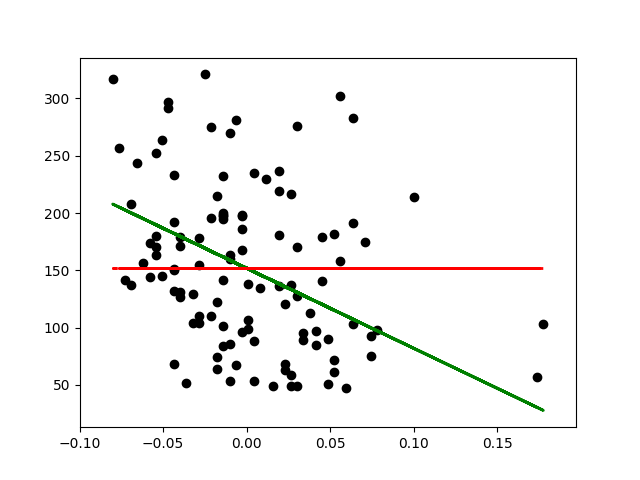

In [154]:
# Plot outputs
plt.scatter(X_test, y_test,  color='black')
plt.plot(X_test, y_predict, color='green', linewidth=2)
plt.plot(X_test, y_predict_dummy_mean, color='red', linestyle = 'dashed', linewidth=2, label = 'dummy')
plt.show()

### Model selection using evaluation metrics
#### Cross-validation example

In [172]:
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC

dataset = load_digits()
X, y = dataset.data, dataset.target == 1
clf = SVC(kernel='linear', C=1)

print('Cross-validation (accuracy)', cross_val_score(clf, X, y, cv=5))                   # accuracy is default scoring metric
print('Cross-validation (AUC)     ', cross_val_score(clf, X, y, cv=5, scoring = 'roc_auc'))   # use AUC as scoring metric
print('Cross-validation (recall)  ', cross_val_score(clf, X, y, cv=5, scoring = 'recall')) # use recall as scoring metric

Cross-validation (accuracy) [0.91944444 0.98611111 0.97214485 0.97493036 0.96935933]
Cross-validation (AUC)      [0.9641871  0.9976571  0.99372205 0.99699002 0.98675611]
Cross-validation (recall)   [0.81081081 0.89189189 0.83333333 0.83333333 0.83333333]


## Grid Search Example

### default metric to optimize over grid parameters: accuracy

In [182]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

dataset = load_digits()
X, y = dataset.data, dataset.target == 1
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

clf = SVC(kernel='rbf')
grid_values = {'gamma':[0.001,0.01,0.5,0.1,1,5,10]}

grid_clf_acc = GridSearchCV(clf, param_grid=grid_values)
grid_clf_acc.fit(X_train, y_train)
y_decision_function_acc = grid_clf_acc.decision_function(X_test)

print('Grid best parameter (max. accuracy): ', grid_clf_acc.best_params_)
print('Grid best score (accuracy)         : ', grid_clf_acc.best_score_)

Grid best parameter (max. accuracy):  {'gamma': 0.001}
Grid best score (accuracy)         :  0.9962880475129918


### alternative metric to optimize over grid parameters: AUC

In [183]:
grid_clf_auc = GridSearchCV(clf, param_grid = grid_values, scoring = 'roc_auc')
grid_clf_auc.fit(X_train, y_train)
y_decision_fn_scores_auc = grid_clf_auc.decision_function(X_test) 

print('Test set AUC                  : ', roc_auc_score(y_test, y_decision_fn_scores_auc))
print('Grid best parameter (max. AUC): ', grid_clf_auc.best_params_)
print('Grid best score (AUC)         : ', grid_clf_auc.best_score_)

Test set AUC                  :  0.99982858122393
Grid best parameter (max. AUC):  {'gamma': 0.001}
Grid best score (AUC)         :  0.9998741278302142


#### Evaluation metrics supported for model selection


In [187]:
from sklearn.metrics import SCORERS
for i in sorted(list(SCORERS.keys())):    
    print(i)

accuracy
adjusted_mutual_info_score
adjusted_rand_score
average_precision
completeness_score
explained_variance
f1
f1_macro
f1_micro
f1_samples
f1_weighted
fowlkes_mallows_score
homogeneity_score
log_loss
mean_absolute_error
mean_squared_error
median_absolute_error
mutual_info_score
neg_log_loss
neg_mean_absolute_error
neg_mean_squared_error
neg_mean_squared_log_error
neg_median_absolute_error
normalized_mutual_info_score
precision
precision_macro
precision_micro
precision_samples
precision_weighted
r2
recall
recall_macro
recall_micro
recall_samples
recall_weighted
roc_auc
v_measure_score


### Two-feature classification example using the digits dataset
#### Optimizing a classifier using different evaluation metrics

In [191]:
from adspy_shared_utilities import plot_class_regions_for_classifier_subplot
dataset = load_digits()
X, y = dataset.data, dataset.target == 1
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Create a two-feature input vector matching the example plot above
# We jitter the points (add a small amount of random noise) in case there are areas in feature space where many instances have the same features.
jitter_delta = 0.25
X_twovar_train = X_train[:,[20,59]]+ np.random.rand(X_train.shape[0], 2) - jitter_delta
X_twovar_test  = X_test[:,[20,59]] + np.random.rand(X_test.shape[0], 2) - jitter_delta


<IPython.core.display.Javascript object>


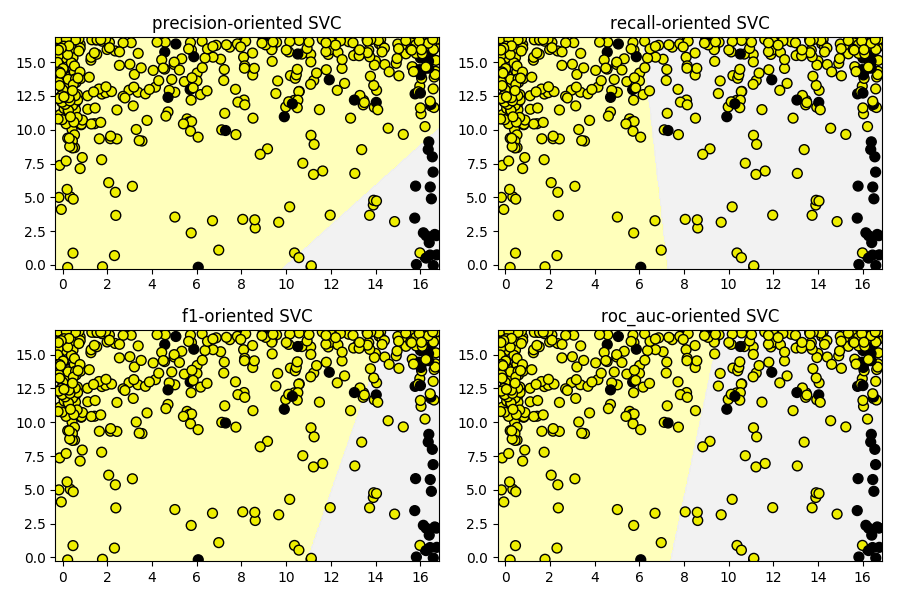

Grid best parameter (max. precision): {'class_weight': {1: 2}}
Grid best score (precision): 0.5459082285362908
Grid best parameter (max. recall): {'class_weight': {1: 50}}
Grid best score (recall): 0.935661321592438
Grid best parameter (max. f1): {'class_weight': {1: 4}}
Grid best score (f1): 0.5086037025447838
Grid best parameter (max. roc_auc): {'class_weight': {1: 20}}
Grid best score (roc_auc): 0.8917580524015791


In [192]:
clf = SVC(kernel = 'linear').fit(X_twovar_train, y_train)
grid_values = {'class_weight':['balanced', {1:2},{1:3},{1:4},{1:5},{1:10},{1:20},{1:50}]}
plt.figure(figsize=(9,6))

for i, eval_metric in enumerate(('precision','recall', 'f1','roc_auc')):
    grid_clf_custom = GridSearchCV(clf, param_grid=grid_values, scoring=eval_metric)
    grid_clf_custom.fit(X_twovar_train, y_train)
    print('Grid best parameter (max. {0}): {1}'.format(eval_metric, grid_clf_custom.best_params_))
    print('Grid best score ({0}): {1}'.format(eval_metric, grid_clf_custom.best_score_))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    plot_class_regions_for_classifier_subplot(grid_clf_custom, X_twovar_test, y_test, None,None, None,  plt.subplot(2, 2, i+1))
    plt.title(eval_metric+'-oriented SVC')
plt.tight_layout()
plt.show()

#### Precision-recall curve for the default SVC classifier (with balanced class weights)

In [193]:
from adspy_shared_utilities import plot_class_regions_for_classifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.svm import SVC

dataset = load_digits()
X, y = dataset.data, dataset.target == 1
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# create a two-feature input vector matching the example plot above
jitter_delta = 0.25
X_twovar_train = X_train[:,[20,59]]+ np.random.rand(X_train.shape[0], 2) - jitter_delta
X_twovar_test  = X_test[:,[20,59]] + np.random.rand(X_test.shape[0], 2) - jitter_delta

In [194]:
clf = SVC(kernel='linear', class_weight='balanced').fit(X_twovar_train, y_train)

y_scores = clf.decision_function(X_twovar_test)

precision, recall, thresholds = precision_recall_curve(y_test, y_scores)
closest_zero = np.argmin(np.abs(thresholds))
closest_zero_p = precision[closest_zero]
closest_zero_r = recall[closest_zero]

<IPython.core.display.Javascript object>


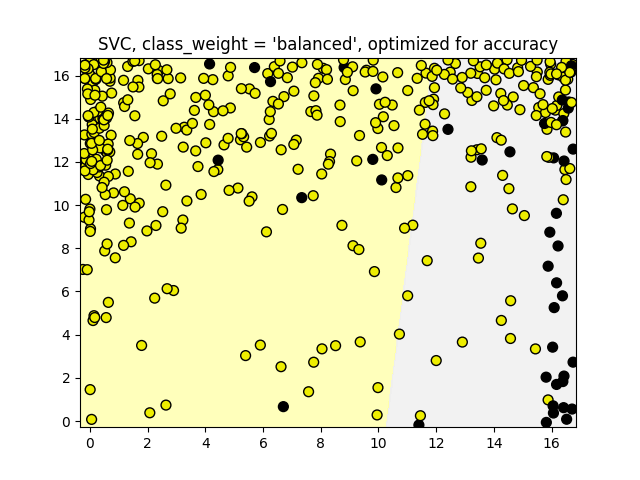

<IPython.core.display.Javascript object>


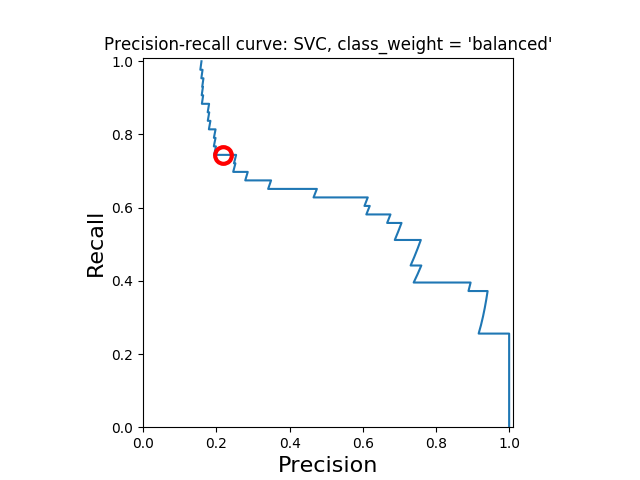

At zero threshold, precision: 0.22, recall: 0.74


In [195]:
plot_class_regions_for_classifier(clf, X_twovar_test, y_test)
plt.title("SVC, class_weight = 'balanced', optimized for accuracy")
plt.show()

plt.figure()
plt.xlim([0.0, 1.01])
plt.ylim([0.0, 1.01])
plt.title ("Precision-recall curve: SVC, class_weight = 'balanced'")
plt.plot(precision, recall, label = 'Precision-Recall Curve')
plt.plot(closest_zero_p, closest_zero_r, 'o', markersize=12, fillstyle='none', c='r', mew=3)
plt.xlabel('Precision', fontsize=16)
plt.ylabel('Recall', fontsize=16)
plt.axes().set_aspect('equal')
plt.show()
print('At zero threshold, precision: {:.2f}, recall: {:.2f}'.format(closest_zero_p, closest_zero_r))

# Unsupervised Learning

In [3]:
%matplotlib notebook
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()
(X_cancer, y_cancer) = load_breast_cancer(return_X_y = True)

fruits = pd.read_table('fruit_data_with_colors.txt')
X_fruits = fruits[['mass','width','height', 'color_score']]
y_fruits = fruits[['fruit_label']] - 1

C:\Users\Akshay.V\AppData\Local\Continuum\anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)


## Dimentionality Reduction and Manifold Learning
### Principal Componant Analysis (PCA)
#### Using PCA to find the first two principal componants in the Breast Cancer dataset

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

### Before applying PCA, each feature should be centered (zero mean) and with unit variance

In [8]:
X_cancer[0]

array([1.799e+01, 1.038e+01, 1.228e+02, 1.001e+03, 1.184e-01, 2.776e-01,
       3.001e-01, 1.471e-01, 2.419e-01, 7.871e-02, 1.095e+00, 9.053e-01,
       8.589e+00, 1.534e+02, 6.399e-03, 4.904e-02, 5.373e-02, 1.587e-02,
       3.003e-02, 6.193e-03, 2.538e+01, 1.733e+01, 1.846e+02, 2.019e+03,
       1.622e-01, 6.656e-01, 7.119e-01, 2.654e-01, 4.601e-01, 1.189e-01])

In [6]:
X_normalized = StandardScaler().fit(X_cancer).transform(X_cancer)
X_normalized[0]

array([ 1.09706398, -2.07333501,  1.26993369,  0.9843749 ,  1.56846633,
        3.28351467,  2.65287398,  2.53247522,  2.21751501,  2.25574689,
        2.48973393, -0.56526506,  2.83303087,  2.48757756, -0.21400165,
        1.31686157,  0.72402616,  0.66081994,  1.14875667,  0.90708308,
        1.88668963, -1.35929347,  2.30360062,  2.00123749,  1.30768627,
        2.61666502,  2.10952635,  2.29607613,  2.75062224,  1.93701461])

In [11]:
pca = PCA(n_components=2).fit(X_normalized)

X_pca = pca.transform(X_normalized)
X_pca[0]

array([9.19283683, 1.94858307])

In [10]:
print(X_cancer.shape, X_pca.shape)

(569, 30) (569, 2)


### Plotting the PCA-transformed version of the Breast Cancer Dataset

<IPython.core.display.Javascript object>


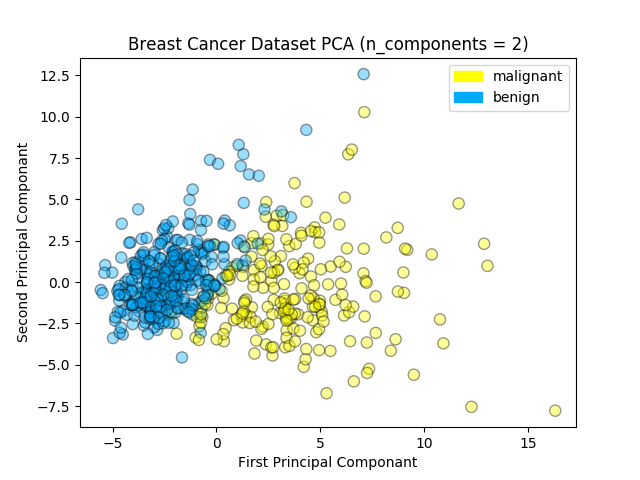

In [12]:
from adspy_shared_utilities import plot_labelled_scatter
plot_labelled_scatter(X_pca, y_cancer, ['malignant', 'benign'])

plt.xlabel('First Principal Componant')
plt.ylabel('Second Principal Componant')
plt.title('Breast Cancer Dataset PCA (n_components = 2)');

#### plotting the magnitude of each feature value for the first two principal componants

<IPython.core.display.Javascript object>


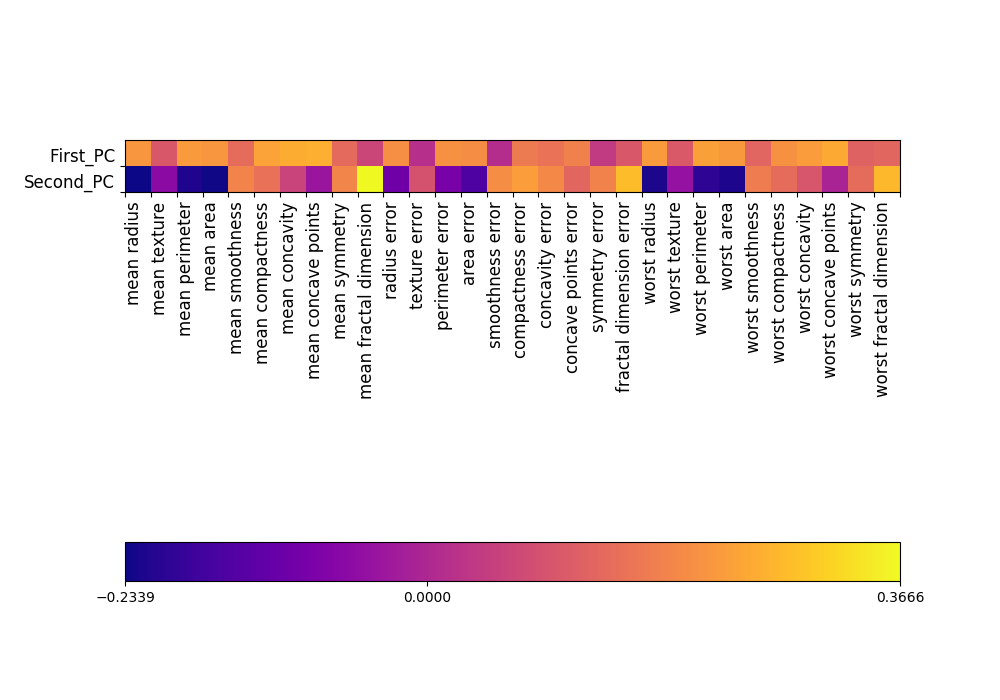

In [17]:
fig = plt.figure(figsize=(10,7))
plt.imshow(pca.components_, interpolation='none', cmap='plasma')
feature_names = list(cancer.feature_names)

plt.gca().set_xticks(np.arange(-.5, len(feature_names)));
plt.gca().set_yticks(np.arange(.5,2));
plt.gca().set_xticklabels(feature_names, rotation = 90, ha='left', fontsize = 12);
plt.gca().set_yticklabels(['First_PC', 'Second_PC'], va='bottom', fontsize = 12);
plt.colorbar(orientation = 'horizontal', ticks=[pca.components_.min(), 0, pca.components_.max()], pad=0.65);

#### PCA on the fruit dataset (for comparison)

In [22]:
X_fruits.as_matrix

<bound method NDFrame.as_matrix of     mass  width  height  color_score
0    192    8.4     7.3         0.55
1    180    8.0     6.8         0.59
2    176    7.4     7.2         0.60
3     86    6.2     4.7         0.80
4     84    6.0     4.6         0.79
5     80    5.8     4.3         0.77
6     80    5.9     4.3         0.81
7     76    5.8     4.0         0.81
8    178    7.1     7.8         0.92
9    172    7.4     7.0         0.89
10   166    6.9     7.3         0.93
11   172    7.1     7.6         0.92
12   154    7.0     7.1         0.88
13   164    7.3     7.7         0.70
14   152    7.6     7.3         0.69
15   156    7.7     7.1         0.69
16   156    7.6     7.5         0.67
17   168    7.5     7.6         0.73
18   162    7.5     7.1         0.83
19   162    7.4     7.2         0.85
20   160    7.5     7.5         0.86
21   156    7.4     7.4         0.84
22   140    7.3     7.1         0.87
23   170    7.6     7.9         0.88
24   342    9.0     9.4         0.75
25 

In [18]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X_normalized = StandardScaler().fit(X_fruits).transform(X_fruits)
X_normalized

array([[ 0.52944179,  1.59869024, -0.29139659, -2.79359541],
       [ 0.30946246,  1.10485399, -0.66192242, -2.26868417],
       [ 0.23613601,  0.36409961, -0.36550175, -2.13745636],
       [-1.41370901, -1.11740915, -2.21813091,  0.48709984],
       [-1.45037224, -1.36432727, -2.29223608,  0.35587203],
       [-1.52369868, -1.6112454 , -2.51455158,  0.09341641],
       [-1.52369868, -1.48778634, -2.51455158,  0.61832765],
       [-1.59702513, -1.6112454 , -2.73686708,  0.61832765],
       [ 0.27279923, -0.00627758,  0.07912925,  2.06183356],
       [ 0.16280957,  0.36409961, -0.51371209,  1.66815013],
       [ 0.0528199 , -0.25319571, -0.29139659,  2.19306137],
       [ 0.16280957, -0.00627758, -0.06908109,  2.06183356],
       [-0.16715944, -0.12973664, -0.43960692,  1.53692232],
       [ 0.01615667,  0.24064055,  0.00502408, -0.82517826],
       [-0.20382266,  0.61101774, -0.29139659, -0.95640607],
       [-0.13049622,  0.7344768 , -0.43960692, -0.95640607],
       [-0.13049622,  0.

In [19]:
pca = PCA(n_components=2).fit(X_normalized)
X_pca = pca.transform(X_normalized)
X_pca

array([[ 1.57216938, -1.98004398],
       [ 0.87841688, -1.5793734 ],
       [ 0.52977322, -1.73289051],
       [-2.71261023,  0.41467382],
       [-2.89341158,  0.24200292],
       [-3.14907175, -0.0227446 ],
       [-3.16435024,  0.48979866],
       [-3.39197004,  0.49705157],
       [-0.1337842 ,  1.92251073],
       [-0.21783491,  1.77601184],
       [-0.61983992,  2.02528232],
       [-0.27623512,  1.93637892],
       [-0.65153341,  1.44776118],
       [ 0.28790153, -0.6930091 ],
       [ 0.23873686, -0.69117127],
       [ 0.28247682, -0.61002894],
       [ 0.40154031, -0.95274558],
       [ 0.37479841, -0.23727398],
       [-0.09457474,  1.03234545],
       [-0.17247687,  1.2237516 ],
       [-0.03541549,  1.31528018],
       [-0.14616449,  1.04663218],
       [-0.57656054,  1.37171952],
       [ 0.2545604 ,  1.55238094],
       [ 4.06190602,  0.7801176 ],
       [ 4.29183685,  0.92853405],
       [ 4.66783223,  0.95558303],
       [ 1.28997005,  0.08988633],
       [-0.67982451,

In [20]:
print(X_fruits.shape)
print(X_normalized.shape)
print(X_pca.shape)

(59, 4)
(59, 4)
(59, 2)


<IPython.core.display.Javascript object>


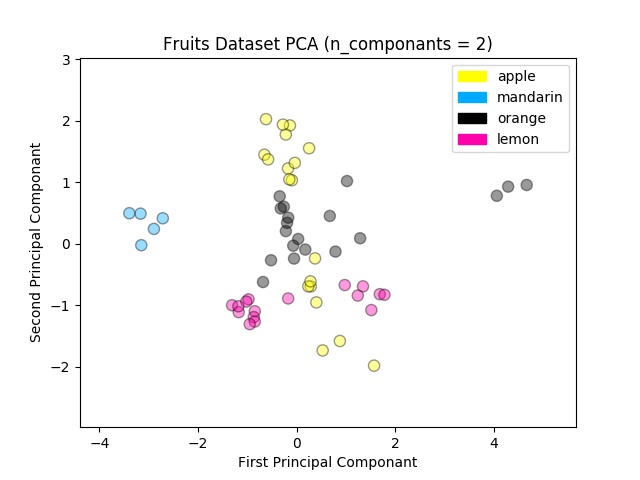

In [23]:
from adspy_shared_utilities import plot_labelled_scatter
plot_labelled_scatter(X_pca, y_fruits, ['apple', 'mandarin', 'orange', 'lemon'])

plt.xlabel('First Principal Componant')
plt.ylabel('Second Principal Componant')
plt.title('Fruits Dataset PCA (n_componants = 2)')

### Manifold Learning
#### Multidimensional scaling (MDS) on the fruits dataset

In [24]:
from adspy_shared_utilities import plot_labelled_scatter
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS

#### each feature should be centered (zero mean) and with unit variance

In [25]:
X_fruits_normalized = StandardScaler().fit(X_fruits).transform(X_fruits)
X_fruits_normalized

array([[ 0.52944179,  1.59869024, -0.29139659, -2.79359541],
       [ 0.30946246,  1.10485399, -0.66192242, -2.26868417],
       [ 0.23613601,  0.36409961, -0.36550175, -2.13745636],
       [-1.41370901, -1.11740915, -2.21813091,  0.48709984],
       [-1.45037224, -1.36432727, -2.29223608,  0.35587203],
       [-1.52369868, -1.6112454 , -2.51455158,  0.09341641],
       [-1.52369868, -1.48778634, -2.51455158,  0.61832765],
       [-1.59702513, -1.6112454 , -2.73686708,  0.61832765],
       [ 0.27279923, -0.00627758,  0.07912925,  2.06183356],
       [ 0.16280957,  0.36409961, -0.51371209,  1.66815013],
       [ 0.0528199 , -0.25319571, -0.29139659,  2.19306137],
       [ 0.16280957, -0.00627758, -0.06908109,  2.06183356],
       [-0.16715944, -0.12973664, -0.43960692,  1.53692232],
       [ 0.01615667,  0.24064055,  0.00502408, -0.82517826],
       [-0.20382266,  0.61101774, -0.29139659, -0.95640607],
       [-0.13049622,  0.7344768 , -0.43960692, -0.95640607],
       [-0.13049622,  0.

In [26]:
mds = MDS(n_components=2)
X_fruits_mds = mds.fit_transform(X_fruits_normalized)
X_fruits_mds

array([[-1.21458579,  3.13088179],
       [-0.46503264,  2.66755286],
       [-0.1189275 ,  2.26896055],
       [ 2.68220824, -1.20965546],
       [ 2.91034868, -1.08248688],
       [ 3.28660538, -0.9014341 ],
       [ 3.10764197, -1.37522645],
       [ 3.35395239, -1.45122213],
       [-0.35875289, -2.0694346 ],
       [-0.15022206, -1.76884012],
       [ 0.13614509, -2.23920524],
       [-0.19235606, -2.0772793 ],
       [ 0.33978836, -1.58669197],
       [-0.13970573,  0.73228904],
       [-0.14380388,  0.99068515],
       [-0.19847151,  1.06312656],
       [-0.20948239,  1.28748739],
       [-0.31331548,  0.3329381 ],
       [-0.13628   , -1.02414708],
       [-0.08153015, -1.2295733 ],
       [-0.27313824, -1.31067291],
       [-0.08149124, -1.0722092 ],
       [ 0.26177802, -1.48432292],
       [-0.63407696, -1.5106639 ],
       [-4.26258872, -0.12603852],
       [-4.55289025, -0.31704184],
       [-4.94434458, -0.31687733],
       [-1.38475297,  0.07689208],
       [ 0.80979731,

In [27]:
print(X_fruits.shape)
print(X_fruits_normalized.shape)
print(X_fruits_mds.shape)

(59, 4)
(59, 4)
(59, 2)


<IPython.core.display.Javascript object>


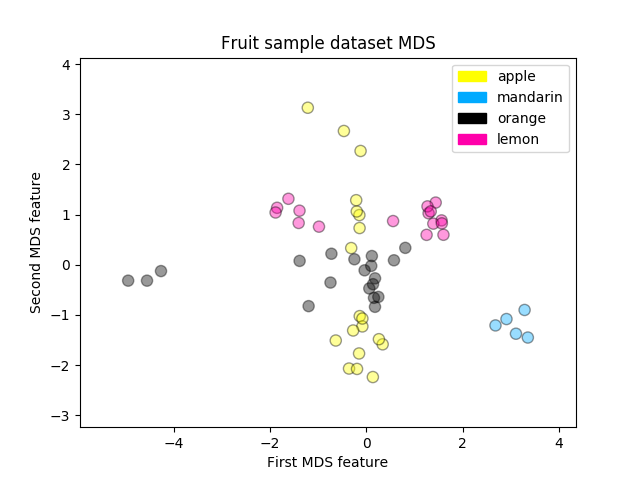

In [28]:
plot_labelled_scatter(X_fruits_mds, y_fruits, ['apple', 'mandarin', 'orange', 'lemon'])
plt.xlabel('First MDS feature')
plt.ylabel('Second MDS feature')
plt.title('Fruit sample dataset MDS');

#### Multidimensional Scaling on Breast Cancer dataset

<IPython.core.display.Javascript object>


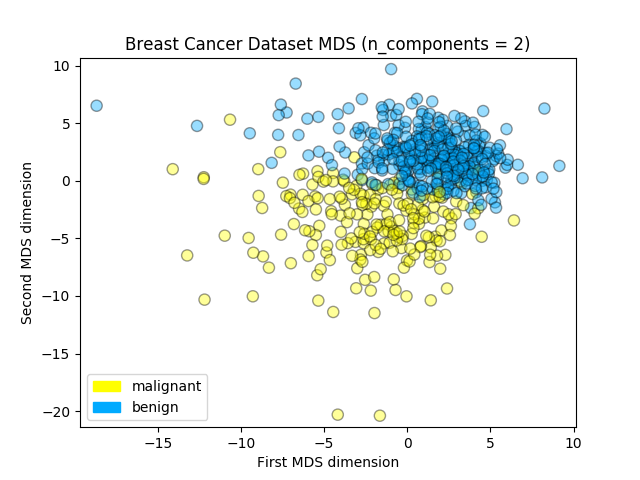

In [29]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
from sklearn.datasets import load_breast_cancer

cancer = load_breast_cancer()
(X_cancer, y_cancer) = load_breast_cancer(return_X_y = True)

# each feature should be centered (zero mean) and with unit variance
X_normalized = StandardScaler().fit(X_cancer).transform(X_cancer)  

mds = MDS(n_components = 2)

X_mds = mds.fit_transform(X_normalized)

from adspy_shared_utilities import plot_labelled_scatter
plot_labelled_scatter(X_mds, y_cancer, ['malignant', 'benign'])

plt.xlabel('First MDS dimension')
plt.ylabel('Second MDS dimension')
plt.title('Breast Cancer Dataset MDS (n_components = 2)');

### t_SNE on the fruit dataset
(In this example, you can see how some dimensionality reduction methods may be less successful on some datasets. Here, it doesn't work as well at finding structure in the small fruits dataset, compared to other methods like MDS.)

<IPython.core.display.Javascript object>


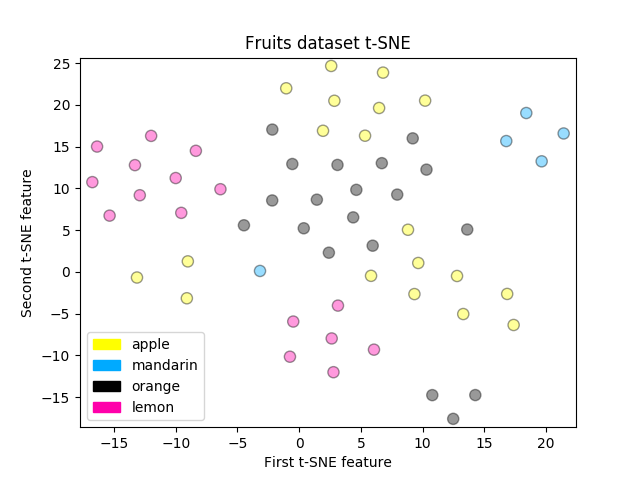

In [31]:
from sklearn.manifold import TSNE

tsne = TSNE(random_state = 0)

X_tsne = tsne.fit_transform(X_fruits_normalized)

plot_labelled_scatter(X_tsne, y_fruits, ['apple', 'mandarin', 'orange', 'lemon'])
plt.xlabel('First t-SNE feature')
plt.ylabel('Second t-SNE feature')
plt.title('Fruits dataset t-SNE');

#### t-SNE on the breast cancer dataset

<IPython.core.display.Javascript object>


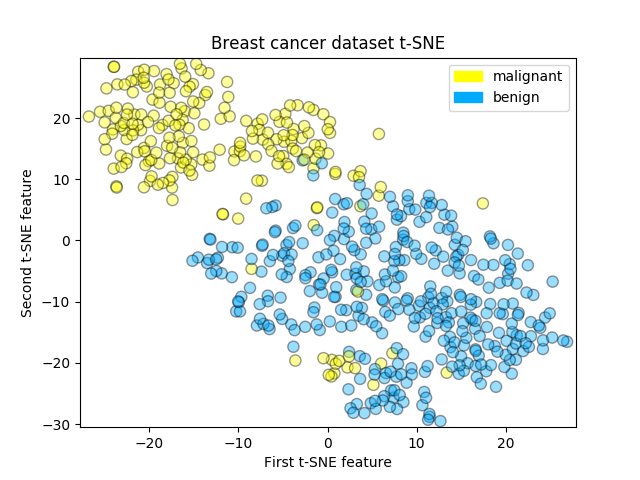

In [32]:
tsne = TSNE(random_state = 0)

X_tsne = tsne.fit_transform(X_normalized)

plot_labelled_scatter(X_tsne, y_cancer, ['malignant', 'benign'])
plt.xlabel('First t-SNE feature')
plt.ylabel('Second t-SNE feature')
plt.title('Breast cancer dataset t-SNE');

## Clustering
### K-means

<IPython.core.display.Javascript object>


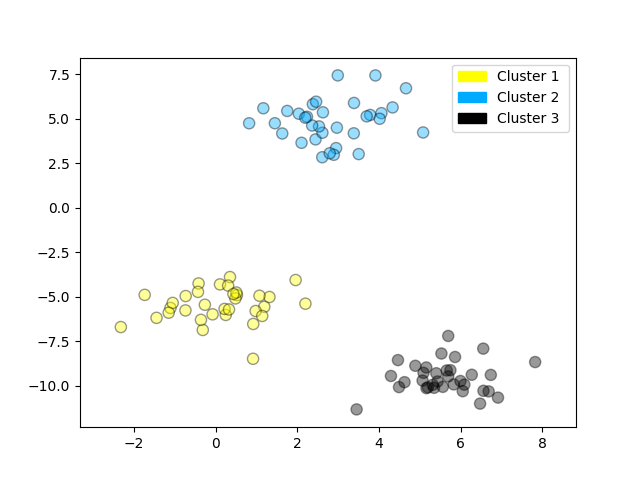

In [36]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from adspy_shared_utilities import plot_labelled_scatter

X,y = make_blobs(random_state = 10)

kmeans = KMeans(n_clusters = 3)
kmeans.fit(X)

plot_labelled_scatter(X, kmean.labels_, ['Cluster 1 ','Cluster 2','Cluster 3'])

Example showing k-means used to find 4 clusters in the fruits dataset.  Note that in general, it's important to scale the individual features before applying k-means clustering.

<IPython.core.display.Javascript object>


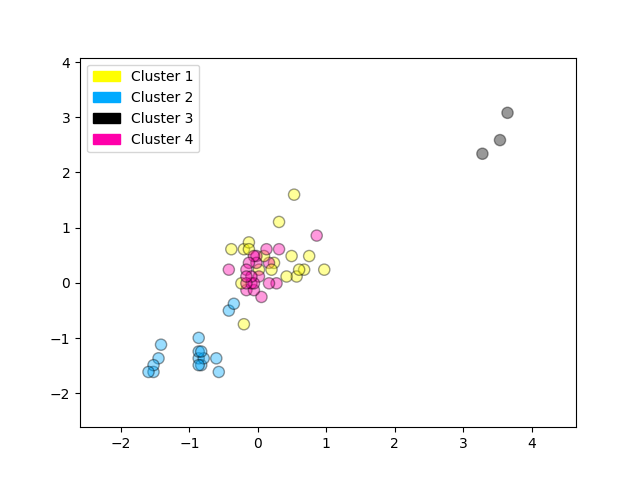

In [37]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from adspy_shared_utilities import plot_labelled_scatter

fruits = pd.read_table('fruit_data_with_colors.txt')
X_fruits = fruits[['mass','width','height', 'color_score']].as_matrix()
y_fruits = fruits[['fruit_label']] - 1

X_normalized = MinMaxScaler().fit(X_fruits).transform(X_fruits)

kmeans = KMeans(n_clusters=4, random_state = 0)
kmeans.fit(X_normalized)

plot_labelled_scatter(X_fruits_normalized, kmeans.labels_, ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'])

<IPython.core.display.Javascript object>


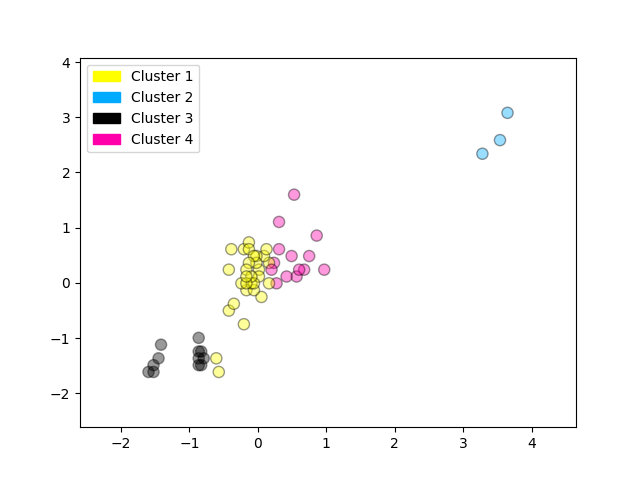

In [38]:
kmeans = KMeans(n_clusters=4, random_state = 0)
kmeans.fit(X_fruits)

plot_labelled_scatter(X_fruits_normalized, kmeans.labels_, ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4'])

### Agglomerative Clustering

<IPython.core.display.Javascript object>


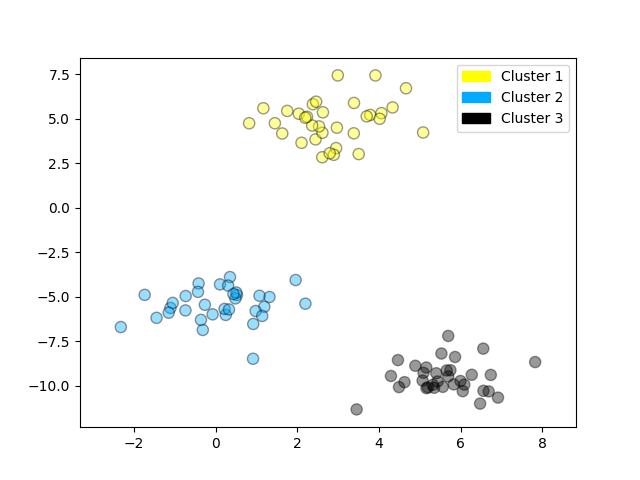

In [41]:
from sklearn.datasets import make_blobs
from sklearn.cluster import AgglomerativeClustering
from adspy_shared_utilities import plot_labelled_scatter

X,y = make_blobs(random_state = 10)

cls = AgglomerativeClustering(n_clusters=3)
cls_assignment = cls.fit_predict(X)

plot_labelled_scatter(X, cls_assignment, ['Cluster 1', 'Cluster 2', 'Cluster 3'])

#### Create a dendrogram (using scipy)
This dendrogram plot is based on the dataset created in the previous step with make_blobs, but only 10 samples have been selected

<IPython.core.display.Javascript object>


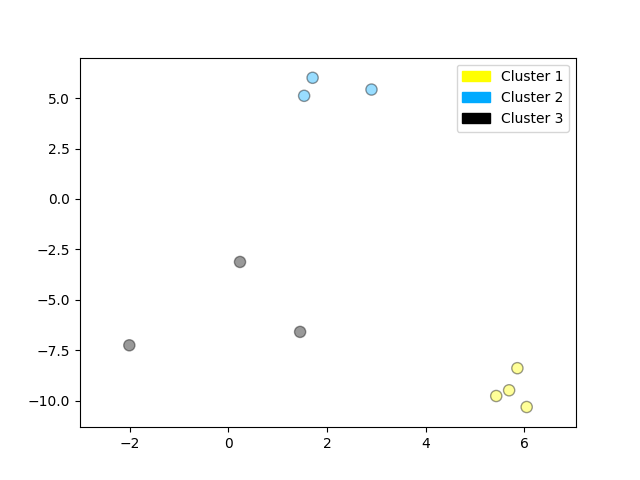

[[  5.69192445  -9.47641249]
 [  1.70789903   6.00435173]
 [  0.23621041  -3.11909976]
 [  2.90159483   5.42121526]
 [  5.85943906  -8.38192364]
 [  6.04774884 -10.30504657]
 [ -2.00758803  -7.24743939]
 [  1.45467725  -6.58387198]
 [  1.53636249   5.11121453]
 [  5.4307043   -9.75956122]]


In [42]:
X, y = make_blobs(random_state = 10, n_samples = 10)
plot_labelled_scatter(X, y, ['Cluster 1', 'Cluster 2', 'Cluster 3'])
print(X)

And here's the dendrogram corresponding to agglomerative clustering of the 10 points above using Ward's method. The index 0..9 of the points corresponds to the index of the points in the X array above. For example, point 0 (5.69, -9.47) and point 9 (5.43, -9.76) are the closest two points and are clustered first.

<IPython.core.display.Javascript object>


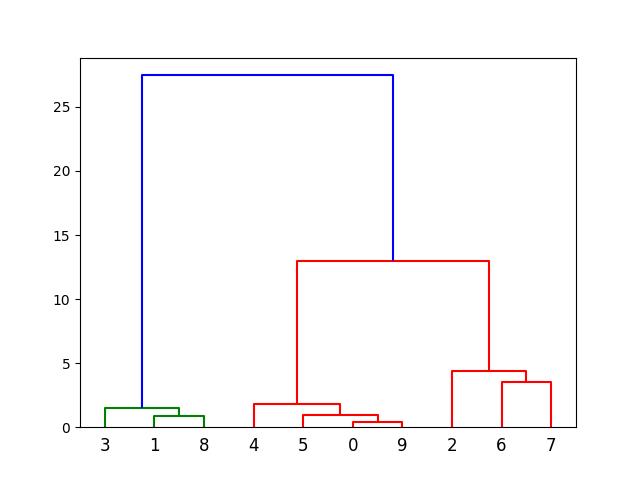

In [44]:
from scipy.cluster.hierarchy import ward, dendrogram
plt.figure()
dendrogram(ward(X))
plt.show()

### DBSCAN Clustering

Cluster membership values:
[ 0  1  0  2  0  0  0  2  2 -1  1  2  0  0 -1  0  0  1 -1  1  1  2  2  2
  1]


<IPython.core.display.Javascript object>


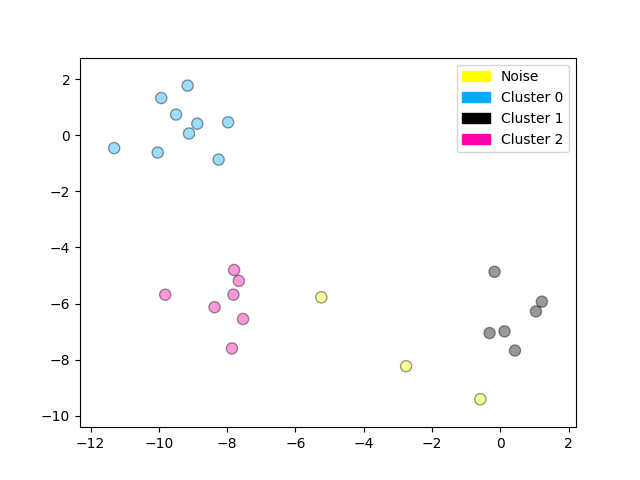

In [46]:
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_blobs

X, y = make_blobs(random_state = 9, n_samples = 25)
dbscan = DBSCAN(eps=2, min_samples=2)

cls = dbscan.fit_predict(X)
print("Cluster membership values:\n{}".format(cls))

plot_labelled_scatter(X, cls + 1, ['Noise', 'Cluster 0', 'Cluster 1', 'Cluster 2'])